<div align="center">

# Earthquake Data Analysis Using Python Scripting (Global Earthquakes 2023)

**Module:** CT7201 - Python Notebooks and Scripting  \
**Tutor:** Dr Zainab Loukil  \
**Date of submission:** 15 January 2026
</div>

**Group project - 3 members**

  Daniel Penson (4520042) \
  Hasini Adihetty (S4530499) \
  Dinis Nascimento (S4540434)


**Repository layout:** see `Instructions/README.md`  \
**Inputs:** `Data/Raw/Earthquake Dataset.csv`, `Data/Raw/Plate Boundaries.csv`  \
**Outputs (this notebook):** written under `Data/Processed/` (cleaned CSV, figures, maps, tables)



---


> **Quick start:**
> 1) Create and activate a Python environment (recommended: conda):
>    - `conda create -n earthquake python=3.11 -y`
>    - `conda activate earthquake`
> 2) Install dependencies: `python -m pip install -r Instructions/Requirements.txt`
> 3) Open the notebook and run all cells top-to-bottom:
>    - From `Earthquake Data Analysis/`, open `Notebooks/01 Earthquake Analysis.ipynb`.
> 4) Outputs saved to `Data/Processed/Figures`, `Data/Processed/Maps`, `Data/Processed/Tables`.


## Table of Contents
-
- [1. Introduction](#1-introduction)
- [2. Data and Provenance](#2-data-and-provenance)
- [3. Cleaning Pipeline](#3-cleaning-pipeline)
- [4. Feature Engineering](#4-feature-engineering)
- [5. Exploratory Data Analysis](#5-exploratory-data-analysis)
- [6. Strong Quake Classification](#6-strong-quake-classification)
- [7. Discussion](#7-discussion)
- [8. Conclusion](#8-conclusion)
- [9. References](#9-references)


<a id="table-of-figures"></a>

**Table of Figures**
1. Figure 1. Magnitude distribution of 2023 earthquakes
2. Figure 2. Depth distribution of 2023 earthquakes (clipped at 99.5th percentile)
3. Figure 3. Global distribution of earthquake epicentres
4. Figure 4. Distribution of event types in the 2023 catalogue
5. Figure 5. Feature engineering workflow
6. Figure 6. Overview of engineered feature groups (temporal, magnitude, region, quality)
7. Figure 7. Magnitude severity profile (enhanced view)
8. Figure 8. Magnitude distribution by depth
9. Figure 9. Global earthquake epicentres with tectonic boundaries and hotspot annotations
10. Figure 10. Magnitude density by depth category (KDE)
11. Figure 11. Distribution of earthquake depths (sanity check)
12. Figure 12. Station-coverage diagnostics (nst and magNst)
13. Figure 13. Nearest-station distance distribution (dmin)
14. Figure 14. Temporal reporting patterns (day-of-week and hour-of-day)
15. Figure 15. Correlation heatmap of key earthquake parameters
16. Figure 16. Magnitude vs. depth (sampled) and magnitude distributions by depth class
17. Figure 17. Interactive global epicentre distribution (Plotly) with static PNG fallback
18. Figure 18. Regional seismicity comparisons (event counts vs major-quake share; depth mix by region)
19. Figure 19. Quality score and uncertainty relationships
20. Figure 20. Random Forest evaluation (confusion matrix, ROC, PR, reliability)
21. Figure 21. Random forest feature importances (top drivers)

<a id="table-of-tables"></a>

**Table of Tables**
1. Table 1. Raw dataset preview (USGS 2023 catalogue; N=26,642)
2. Table 2. Missingness and schema summary (USGS 2023 catalogue; N=26,642)
3. Table 3. Cleaning audit summary (stepwise filtering and rationale)
4. Table 4. Engineered dataset preview (feature-enriched schema; N=24,432)
5. Table 5. Plate-boundary proximity summary (strong vs non-strong)
6. Table 6. Strong-quake classifier metric summary


---

## 1. Introduction

Earthquake catalogues provide standardized records of time, location, magnitude, depth, and measurement quality, enabling comparisons across regions and depth regimes. The 2023 USGS catalogue is a single-year snapshot that captures global patterns but is shaped by reporting coverage and magnitude-of-completeness differences. This project cleans the export, engineers interpretable features, and uses descriptive EDA plus baseline classifiers to contextualize strong events without implying causation. The next section details the dataset fields and constraints that anchor those choices.

---

## 2. Data and Provenance

The analysis uses the USGS 2023 catalogue export as a single-year snapshot of global seismic reporting. The export contains physical fields (time, latitude/longitude, depth, magnitude) alongside network and uncertainty fields (for example `gap`, `rms`, and error terms) that describe measurement quality. Because the catalogue aggregates heterogeneous monitoring networks, missingness and detection thresholds vary geographically; density on maps is interpreted as a mixture of seismicity and observational coverage. These constraints motivate the deterministic cleaning rules (Section 3) and the explicit quality-aware features used in EDA and modelling (Sections 4-6).

**Project objectives**
- Summarise the raw 2023 catalogue and establish baseline distributions.
- Apply transparent, audit-logged cleaning rules to retain physically plausible earthquakes.
- Engineer interpretable features (time, depth/magnitude classes, region proxies, quality metrics).
- Perform EDA to describe global and regional structure.
- Demonstrate post-event detection of strong earthquakes (mag >= 6.0) as a rare-event classification task.

**Method overview (notebook workflow)**
- `df_raw` (load) -> `df_clean` (clean) -> `df_feat` (engineer) -> `BASE_EDA_DF` (EDA base).
- Exports are written under `Data/Processed/` (tables, maps, figures) to support reproducibility.


### 2.1 Inputs

- `Data/Raw/Earthquake Dataset.csv` (USGS catalogue export)
- `Data/Raw/Plate Boundaries.csv` (supporting geometry for context; used for overlays and optional proximity features)


### 2.2 Key fields and units

This analysis uses the USGS catalogue fields with standard geophysical units:

- `time` (UTC timestamp)
- `latitude`, `longitude` (degrees)
- `depth` (km)
- `mag` (reported magnitude; scale indicated by `magType`, e.g., Mw/mb/ml)
- Uncertainty / coverage terms such as `gap`, `rms`, `nst`, `dmin`, `depthError`, `magError`, and `horizontalError` (when available)

The catalogue aggregates multiple networks, so missingness and detection thresholds vary by region; spatial density is interpreted as a mixture of seismicity and reporting coverage.


**What would break if the dataset changes?**

- **Schema drift:** the pipeline assumes columns like `time`, `updated`, `id`, `type`, `latitude`, `longitude`, `depth`, and `mag`. Renamed or missing fields must be mapped before Sections 3-6 can run.
- **Type taxonomy:** if `type` labels change (or are missing), filtering to `type == "earthquake"` may drop the wrong records or fail.
- **Units/semantics:** if depth is not in km, or if magnitudes are not comparable across `magType`, physical bounds and the mag >= 6.0 label become invalid.
- **Plate boundary file:** `Data/Raw/Plate Boundaries.csv` is expected to have `lon`/`lat` columns (or at least two numeric columns); schema changes will affect the custom proximity feature.


### 2.3 Raw dataset quick QA

This section loads the raw CSV and performs a minimal integrity check: a preview of records, a schema/missingness summary, and basic range checks that motivate the cleaning rules in Section 3.


In [42]:
# Reproducibility setup (deterministic runs)
RANDOM_SEED = 42

import os
import random

random.seed(RANDOM_SEED)
os.environ["PYTHONHASHSEED"] = str(RANDOM_SEED)


In [43]:

# Shared module import and pipeline initialisation
#
# This notebook is typically run from `Earthquake Data Analysis/Notebooks/` as
# described in `Instructions/README.md`. For reproducibility, the block below
# also supports running from the repo root by adding the notebook directory to
# `sys.path` when needed.

import sys
from pathlib import Path

for cand in (
    Path.cwd(),
    Path.cwd() / 'Notebooks',
    Path.cwd() / 'Earthquake Data Analysis' / 'Notebooks',
):
    if (cand / 'earthquakelibs.py').exists() and str(cand) not in sys.path:
        sys.path.insert(0, str(cand))
        break

try:
    import earthquakelibs as eq
except ImportError as exc:
    raise ImportError(
        'Could not import `earthquakelibs.py`. Open `Earthquake Data Analysis/Notebooks/01 Earthquake Analysis.ipynb` and run all cells.'
    ) from exc

libs = eq.libs

np = libs.np
pd = libs.pd
plt = libs.plt
sns = libs.sns
warnings = libs.warnings

# Project paths (canonical for this repo)
PROJECT_ROOT = eq.PROJECT_ROOT
INSTRUCTIONS_DIR = eq.INSTRUCTIONS_DIR
NOTEBOOKS_DIR = eq.NOTEBOOKS_DIR
DATA_DIR = eq.DATA_DIR
RAW_DIR = eq.RAW_DIR
PROCESSED_DIR = eq.PROCESSED_DIR
FIGURES_DIR = eq.FIGURES_DIR
MAPS_DIR = eq.MAPS_DIR
TABLES_DIR = eq.TABLES_DIR
IMAGES_DIR = eq.IMAGES_DIR

DATA_FILE = eq.DATA_FILE
WORLD_MAP_FILE = eq.WORLD_MAP_FILE
PLATE_FILE = eq.PLATE_FILE
UNI_LOGO_FILE = eq.UNI_LOGO_FILE

# Deterministic RNG for numpy/scikit-learn usage.
if 'RANDOM_SEED' in globals():
    try:
        np.random.seed(int(RANDOM_SEED))
    except Exception:
        pass

# Notebook-wide style + warning behaviour
libs.silence_warnings()
eq.apply_default_plot_style()

# Pipeline (initialised once): load -> clean -> engineer -> export

import os

# Optional override for restricted environments (keeps default repo layout when unset).
OUTPUT_ROOT = Path(os.environ.get('EARTHQUAKE_OUTPUT_DIR', str(PROCESSED_DIR))).resolve()
if OUTPUT_ROOT != PROCESSED_DIR:
    print('NOTE: Output root overridden via EARTHQUAKE_OUTPUT_DIR:', OUTPUT_ROOT)

# Rebind output paths for this run (default stays `Data/Processed/`).
PROCESSED_DIR = OUTPUT_ROOT
FIGURES_DIR = PROCESSED_DIR / 'Figures'
MAPS_DIR = PROCESSED_DIR / 'Maps'
TABLES_DIR = PROCESSED_DIR / 'Tables'
IMAGES_DIR = PROCESSED_DIR / 'Images'
WORLD_MAP_FILE = IMAGES_DIR / 'World Map.png'
UNI_LOGO_FILE = IMAGES_DIR / 'UniLogo.png'

pipeline = eq.EarthquakePipeline(
    data_file=DATA_FILE,
    outputs_dir=PROCESSED_DIR,
    figures_dir=FIGURES_DIR,
    maps_dir=MAPS_DIR,
    tables_dir=TABLES_DIR,
)

# Explicit filesystem setup (keeps `earthquakelibs` import safe).
try:
    if hasattr(pipeline, "ensure_dirs"):
        pipeline.ensure_dirs()
    else:
        # Backwards-compatible fallback for older `earthquakelibs.py` versions
        for p in (pipeline.outputs_dir, pipeline.figures_dir, pipeline.maps_dir, pipeline.tables_dir):
            p.mkdir(parents=True, exist_ok=True)
    IMAGES_DIR.mkdir(parents=True, exist_ok=True)
except OSError as exc:
    raise RuntimeError(
        f'Cannot create output directories under {PROCESSED_DIR}. '
        'If the repo location is not writable, set EARTHQUAKE_OUTPUT_DIR to a writable folder and rerun.'
    ) from exc

print('Dependency status:', libs.availability())
print('Resolved paths:')
print(' - PROJECT_ROOT:', PROJECT_ROOT)
print(' - DATA_FILE:', DATA_FILE)
print(' - PROCESSED_DIR:', PROCESSED_DIR)


Dependency status: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}
Resolved paths:
 - PROJECT_ROOT: E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis
 - DATA_FILE: E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Raw\Earthquake Dataset.csv
 - PROCESSED_DIR: E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Processed


In [44]:
def preview_table(df, n=5):
    """
    Neatly preview the first n rows of a dataframe with human-readable column names.

    - Replaces underscores with spaces in column names for display.
    - Leaves the underlying dataframe unchanged.
    """
    preview = df.head(n).copy()
    preview.columns = [c.replace("_", " ") for c in preview.columns]
    return preview

def ensure_modelling_deps(verbose: bool = True):
    """Assert modelling dependencies are available (no installs inside the notebook)."""
    missing = []
    if plt is None:
        missing.append('matplotlib')
    if not libs.HAS_SKLEARN:
        missing.append('scikit-learn')

    if missing:
        raise ImportError(
            'Missing modelling dependencies: ' + ', '.join(missing)
            + '\nInstall dependencies from Instructions/Requirements.txt.'
        )

    if verbose:
        print('Dependency status:', libs.availability())

EXPORT_FIGURES = True


def save_matplotlib(fig, filename: str, *, dpi: int = 300):
    # Save a matplotlib figure to FIGURES_DIR (returns the path).
    if not globals().get('EXPORT_FIGURES', True):
        return None
    if fig is None:
        return None

    out_dir = globals().get('FIGURES_DIR')
    if out_dir is None:
        return None

    try:
        out_dir.mkdir(parents=True, exist_ok=True)
    except Exception:
        pass

    path = out_dir / filename
    try:
        fig.savefig(path, dpi=dpi, bbox_inches='tight')
        return path
    except Exception as exc:
        print(f"Warning: could not save figure to {path}: {exc}")
        return None



**2.3.1: Shared imports and project paths**

The setup cell loads `earthquakelibs.py`, checks optional dependencies, and resolves `DATA_DIR` and `PROCESSED_DIR` relative to the project root for portable I/O. Visual outputs may fall back to static versions if optional libraries are missing, but the analysis remains consistent.

In [45]:

df_raw = pipeline.load()
try:
    data_path_display = pipeline.data_file.relative_to(PROJECT_ROOT)
except Exception:
    data_path_display = pipeline.data_file
print(f"Loaded dataset from {data_path_display} with shape {df_raw.shape}")
preview_table(df_raw)


Loaded dataset from Data\Raw\Earthquake Dataset.csv with shape (26642, 22)


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01 00:49:25.294000+00:00,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11 22:51:52.040000+00:00,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01 01:41:43.755000+00:00,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11 22:51:45.040000+00:00,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01 03:29:31.070000+00:00,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11 22:51:29.040000+00:00,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01 04:09:32.814000+00:00,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11 22:51:45.040000+00:00,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01 04:29:13.793000+00:00,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11 22:51:38.040000+00:00,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


**Table 1. Raw dataset preview (USGS 2023 catalogue; N=26,642).**
Table 1 shows a sample of the uncleaned export to verify key fields load correctly before filtering.

**2.3.2: Raw catalogue load check**

This cell confirms the CSV loads with expected columns and date parsing, providing a baseline snapshot for later comparisons. It assumes the USGS schema is stable, so any future export changes would require updates to parsing; the numeric summary below quantifies current ranges.

In [46]:
# Schema + missingness summary (raw)

if 'df_raw' not in globals():
    raise NameError('df_raw is missing; run the raw load cell first.')

# Print compact schema to stdout
print('Raw dataframe shape:', df_raw.shape)
df_raw.info()

schema = pd.DataFrame({
    'dtype': df_raw.dtypes.astype(str),
    'non_null': df_raw.notna().sum(),
    'missing': df_raw.isna().sum(),
})
schema['missing_pct'] = (schema['missing'] / len(df_raw) * 100).round(2)

# Sort so the most-missing fields are visible first
schema = schema.sort_values(['missing', 'dtype'], ascending=[False, True])
schema.head(22)


Raw dataframe shape: (26642, 22)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             26642 non-null  datetime64[ns, UTC]
 1   latitude         26642 non-null  float64            
 2   longitude        26642 non-null  float64            
 3   depth            26642 non-null  float64            
 4   mag              26642 non-null  float64            
 5   magType          26642 non-null  object             
 6   nst              25227 non-null  float64            
 7   gap              25225 non-null  float64            
 8   dmin             24776 non-null  float64            
 9   rms              26642 non-null  float64            
 10  net              26642 non-null  object             
 11  id               26642 non-null  object             
 12  updated          26642 non-null  datetime

,dtype,non_null,missing,missing_pct
dmin,float64,24776,1866,7.00
magError,float64,24970,1672,6.28
place,object,25034,1608,6.04
magNst,float64,25065,1577,5.92
horizontalError,float64,25093,1549,5.81
gap,float64,25225,1417,5.32
nst,float64,25227,1415,5.31
time,"datetime64[ns, UTC]",26642,0,0.00
updated,"datetime64[ns, UTC]",26642,0,0.00
latitude,float64,26642,0,0.00


**Table 2. Missingness and schema summary (USGS 2023 catalogue; N=26,642).**
Table 2 summarises field types and missingness in the raw export, highlighting which uncertainty/coverage fields are sparse and therefore require careful handling downstream.


**2.3.3: Numeric summary of raw magnitudes and depths**

Summary statistics establish the scale of magnitudes and depths and justify later bounds, but the tails are sensitive to catalogue completeness by region and time. The schema and missingness profile therefore follows to assess data quality explicitly.

In [47]:
df_raw.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


**2.3.4: Schema and missingness profile**

The schema check identifies field types and missingness to guide coercion or exclusion, but missingness is not necessarily random and can bias quality metrics. That limitation motivates the depth-validity check next.

In [48]:
min_depth = df_raw['depth'].min()
max_depth = df_raw['depth'].max()
print(f"Depth min: {min_depth:.2f} km")
print(f"Depth max: {max_depth:.2f} km")


Depth min: -3.37 km
Depth max: 681.24 km


**2.3.5: Depth validity window (0 to 700 km)**

We apply a **0-700 km** depth window as a practical physical-plausibility filter: most tectonic earthquakes occur within this seismogenic range, and depths outside it often reflect catalogue artefacts or location uncertainty. The trade-off is that rare outliers could be excluded, but the analysis prioritises a reliable, reproducible baseline over retaining extreme edge cases.

In this 2023 export, **43 rows (0.16%)** have `depth` outside the [0, 700] km window (all negative), and these are removed by the depth-validity rule during cleaning.

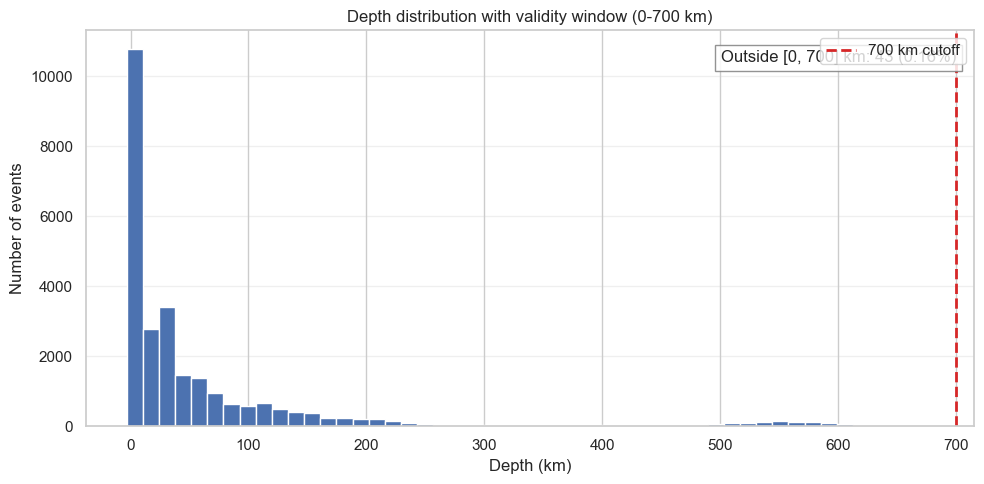

Depth validity window [0,700] km: invalid rows = 43 (0.16% of raw rows)


In [49]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- depth validity window (0-700 km) ---
if 'df_raw' not in globals():
    raise NameError('df_raw is missing; run the raw catalogue load cell first.')

depth_series = pd.to_numeric(df_raw['depth'], errors='coerce').dropna()

invalid_mask = (depth_series < 0) | (depth_series > 700)
n_invalid = int(invalid_mask.sum())
invalid_pct = n_invalid / len(df_raw) * 100

fig, ax = plt.subplots(figsize=(10, 5))

bins = 50
ax.hist(depth_series, bins=bins)

ax.axvline(700, color='tab:red', linestyle='--', linewidth=2, label='700 km cutoff')

ax.set_title('Depth distribution with validity window (0-700 km)')
ax.set_xlabel('Depth (km)')
ax.set_ylabel('Number of events')
ax.grid(axis='y', alpha=0.3)

ax.text(
    0.98,
    0.95,
    f"Outside [0, 700] km: {n_invalid:,} ({invalid_pct:.2f}%)",
    transform=ax.transAxes,
    ha='right',
    va='top',
    bbox=dict(facecolor='white', alpha=0.85, edgecolor='gray'),
)

ax.legend(loc='upper right')

plt.tight_layout()

save_matplotlib(fig, "Figure 2 depth distribution validity window.png")
plt.show()

print(f"Depth validity window [0,700] km: invalid rows = {n_invalid} ({invalid_pct:.2f}% of raw rows)")


**Figure 2. Depth distribution with validity window (0-700 km) (2023 USGS, raw N=26,642).**
Figure 2 visualises the raw depth distribution and the 700 km cutoff used for deterministic cleaning; 43 rows (0.16%) fall outside the window (all negative depths).

**2.3.6: Magnitude distribution and strong-threshold context**

The magnitude histogram provides context for the later binary label **Strong = mag >= 6.0**. Strong events sit in the extreme right tail of the catalogue, so later modelling is treated as a rare-event problem and evaluated with precision-recall metrics and explicit threshold choices.

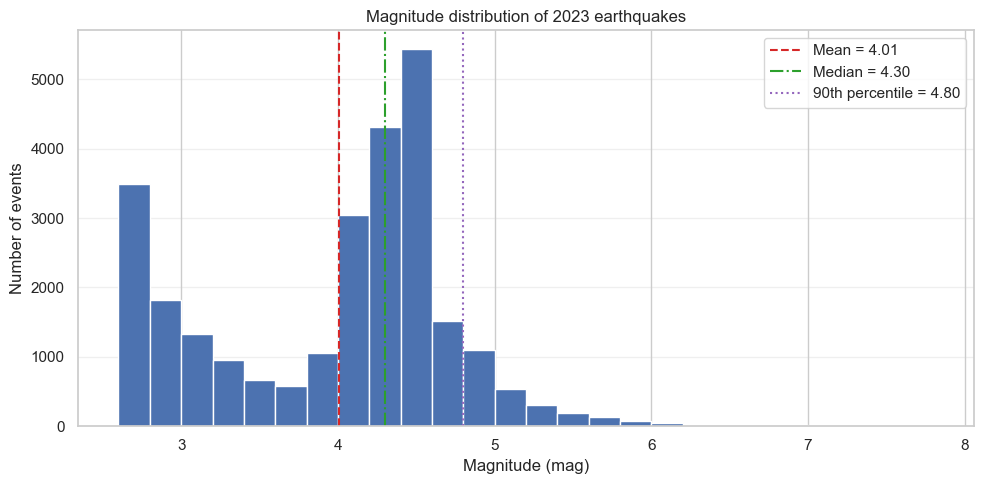

In [50]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- magnitude distribution ---
if 'df_raw' not in globals():
    raise NameError('df_raw is missing; run the raw catalogue load cell first.')
df_mag = df_raw
mag_series = df_mag['mag'].dropna()

mag_min = max(0, mag_series.min())
mag_max = mag_series.max()
bin_width = 0.2
bins = np.arange(mag_min, mag_max + bin_width, bin_width)

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(mag_series, bins=bins)

mag_mean = mag_series.mean()
mag_median = mag_series.median()
mag_q90 = np.percentile(mag_series, 90)

ax.axvline(mag_mean, color='tab:red', linestyle='--', linewidth=1.5, label=f'Mean = {mag_mean:.2f}')
ax.axvline(mag_median, color='tab:green', linestyle='-.', linewidth=1.5, label=f'Median = {mag_median:.2f}')
ax.axvline(mag_q90, color='tab:purple', linestyle=':', linewidth=1.5, label=f'90th percentile = {mag_q90:.2f}')

ax.set_xlabel('Magnitude (mag)')
ax.set_ylabel('Number of events')
ax.set_title('Magnitude distribution of 2023 earthquakes')
ax.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()

save_matplotlib(fig, "Figure 1 magnitude distribution raw.png")
plt.show()


**Figure 1. Magnitude distribution (2023 USGS, raw N=26,642).**
Figure 1 shows the magnitude histogram with mean, median, and upper-quantile markers, highlighting the right-skew that makes strong events rare under the mag >= 6.0 threshold.

**2.3.7: Global depth distribution**

Depth summaries confirm shallow dominance and motivate depth categories, while acknowledging higher uncertainty for deep or sparsely observed events. This uncertainty links to the quality metrics later; a spatial scatter check follows to validate coordinates.

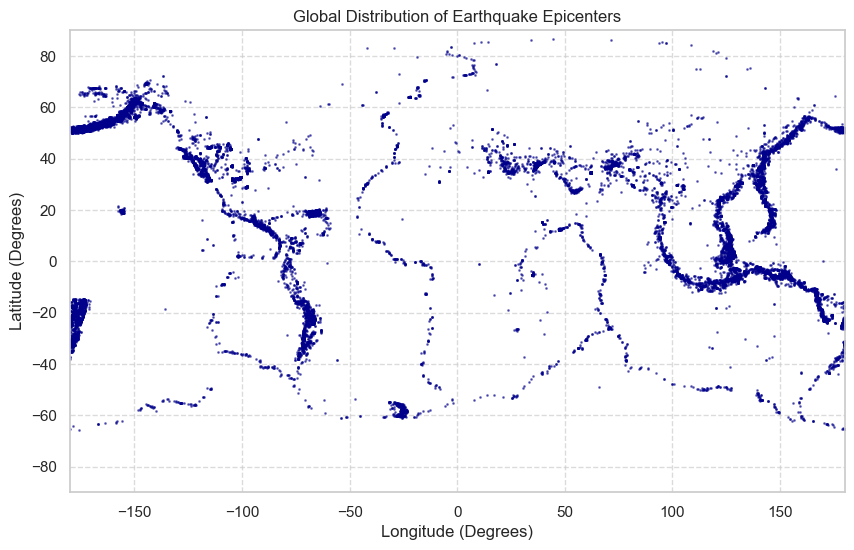

In [51]:


libs.plt.figure(figsize=(10, 6))
libs.plt.scatter(df_raw['longitude'], df_raw['latitude'], s=1, alpha=0.5, c='darkblue')

libs.plt.xlim(-180, 180)
libs.plt.ylim(-90, 90)

libs.plt.title('Global Distribution of Earthquake Epicenters')
libs.plt.xlabel('Longitude (Degrees)')
libs.plt.ylabel('Latitude (Degrees)')
libs.plt.grid(True, linestyle='--', alpha=0.7)


SAVE_SCATTER = False
if SAVE_SCATTER and FIGURES_DIR is not None:
    FIGURES_DIR.mkdir(parents=True, exist_ok=True)
    libs.plt.savefig(FIGURES_DIR / "epicentre_scatter.png")

libs.plt.show()
libs.plt.close()


**Figure 3. Global epicentre distribution (2023 USGS, raw N=26,642).**
Figure 3 shows epicentres clustered along tectonic boundaries, serving as a coordinate sanity check and framing regional contrasts.

**2.3.8: Global spatial scatter sanity check**

The global scatter validates coordinate ranges and motivates a broad region feature for spatial heterogeneity, but clustering is also shaped by monitoring density. The notes below clarify how this pre-check feeds regional grouping.

The expected plate-boundary pattern supports regional binning but does not quantify hazard, so it serves as a sanity check rather than causal evidence.

Later analyses normalize by region and apply sampling caps to avoid dense belts dominating summaries, and the event-type distribution is checked next to confirm the catalogue is earthquake-only before cleaning.

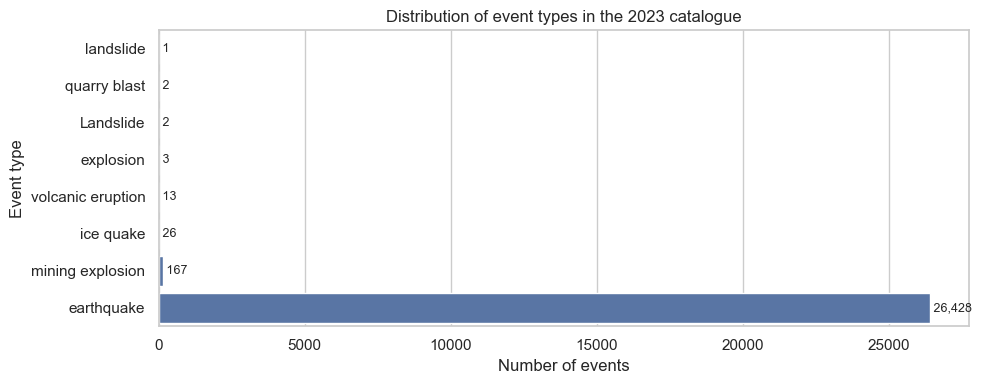

In [52]:
from earthquakelibs import libs

pd = libs.pd
plt = libs.plt
sns = libs.sns

# --- distribution of event types ---
type_counts = (
    df_raw['type']
    .value_counts(dropna=False)
    .sort_values(ascending=True)
)

n_types = len(type_counts)
fig_height = max(4, 0.4 * n_types)
fig, ax = plt.subplots(figsize=(10, fig_height))

sns.barplot(
    y=type_counts.index,
    x=type_counts.values,
    orient='h',
    ax=ax,
)

ax.set_xlabel('Number of events')
ax.set_ylabel('Event type')
ax.set_title('Distribution of event types in the 2023 catalogue')

for i, count in enumerate(type_counts.values):
    ax.text(
        count,
        i,
        f' {count:,}',
        va='center',
        ha='left',
        fontsize=9,
    )

plt.tight_layout()

save_matplotlib(fig, "Figure 4 event type distribution raw.png")
plt.show()


**Figure 4. Event-type distribution (2023 USGS, raw N=26,642).**
Figure 4 shows the raw event-type mix, indicating a small non-earthquake share and motivating filtering to earthquakes only.

**2.3.9: Event type distribution**

The event-type chart shows that non-earthquake records remain and must be removed to avoid bias in magnitude and depth summaries. This assumes type labels are reliable; misclassification would add residual noise, so the cleaning pipeline formalizes the filter.

Tracking the non-earthquake share preserves an audit trail so shifts can be attributed to specific filters rather than hidden data loss.

---

## 3. Cleaning Pipeline

The cleaning stage enforces reproducibility and physical plausibility while minimising subjective choices. We remove exact duplicate rows, retain the latest revision per event ID, filter to events labelled ?earthquake?, coerce essential numeric fields, and apply practical validity windows (latitude/longitude bounds, magnitude bounds, and a 0?700 km depth window where negative depths reflect location uncertainty and depths >700 km are treated as out-of-scope for this one-year catalogue). The audit table reports retained counts after each step to make filtering transparent and to avoid selective ?cherry-picking?.


### 3.1 Design rationale and assumptions

**Why this cleaning rule?**
- **Deduplicate exact rows:** prevents double-counting in summary statistics and models.
- **Keep latest per `id`:** USGS events can be revised; keeping the latest `updated` record avoids mixing revisions.
- **Drop missing essentials:** modelling and geospatial summaries require complete `time/lat/lon/depth/mag`.
- **Physical bounds:** latitude/longitude limits prevent mapping artifacts; depth is limited to 0-700 km (typical seismogenic range); magnitude is limited to 0-10 to remove obvious corrupt values.
- **Filter to earthquakes:** non-earthquake `type` values (for example blasts) distort magnitude/depth distributions and bias models.

**What assumptions does this imply?**
- `type` is correctly labelled.
- Depth outliers (negative or >700 km) are treated as recording errors or out-of-scope extremes.
- The analysis is descriptive for 2023 and does not claim to measure long-term hazard rates.


In [53]:


def clean_data(df, return_audit=False):
    """Clean the raw earthquake DataFrame: deduplicate records, coerce key fields,
    enforce physical bounds, and drop non earthquake event types. Returns a copy
    ready for downstream feature engineering."""
    df = df.copy()
    audit_rows = []

    def log_step(step, before, after, reason):
        removed = before - after
        removed_pct = (removed / before * 100) if before else 0
        audit_rows.append({
            "step": step,
            "n_before": before,
            "n_after": after,
            "removed": removed,
            "removed_pct": round(removed_pct, 2),
            "reason": reason,
        })

    # Drop exact duplicate rows first to get a stable baseline for all subsequent filters.
    before = len(df)
    df = df.drop_duplicates()
    log_step(
        "Drop exact duplicates",
        before,
        len(df),
        "Remove identical rows to avoid double-counting.",
    )

    # Parse timestamps; invalid strings become NaT so date filters and sorting stay reliable.
    df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce", utc=True)

    # If multiple records share an earthquake ID, keep the most recently updated record.
    before = len(df)
    df = (
        df.sort_values("updated")
        .drop_duplicates(subset="id", keep="last")
    )
    log_step(
        "Keep latest per ID",
        before,
        len(df),
        "Keep only the most recent revision for each event ID.",
    )

    # Standardise numeric fields so physical filters behave predictably.
    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    # Remove rows missing essential fields needed for downstream analysis.
    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]
    before = len(df)
    df = df.dropna(subset=essential_cols)
    log_step(
        "Drop missing essentials",
        before,
        len(df),
        f"Remove rows missing {', '.join(essential_cols)}.",
    )

    # Enforce physically plausible latitude/longitude/depth/magnitude ranges.
    before = len(df)
    valid_lat = df["latitude"].between(-90, 90)
    valid_lon = df["longitude"].between(-180, 180)
    # Apply a practical depth window (0?700 km): negative depths reflect location uncertainty; >700 km is treated as out-of-scope here.
    valid_depth = df["depth"].between(0, 700)
    valid_mag = df["mag"].between(0, 10)
    df = df[valid_lat & valid_lon & valid_depth & valid_mag]
    log_step(
        "Filter physical ranges",
        before,
        len(df),
        "Enforce latitude/longitude/depth/magnitude bounds.",
    )

    if "type" in df.columns:
        # Keep only earthquake events, dropping blasts/quarry events and other non earthquake records.
        before = len(df)
        df = df[df["type"] == "earthquake"]
        log_step(
            "Keep earthquake type",
            before,
            len(df),
            "Filter to events labeled as earthquakes only.",
        )

    if return_audit:
        audit_df = pd.DataFrame(audit_rows)
        return df, audit_df

    return df


The `clean_data()` helper applies these rules, preserves the most recent record per ID, and reports removals to keep a documented baseline. Deterministic filters improve reproducibility but may exclude rare valid cases, so the next cell quantifies impact and class balance.

In [54]:
# Run cleaning pipeline and export core outputs.

if 'df_raw' not in globals():
    raise NameError('df_raw is missing; run Section 2.3 first.')

pipeline.clean_fn = clean_data

df_clean, cleaning_audit_df = pipeline.clean(df_raw, return_audit=True)

# Persist audit + cleaned dataset
cleaning_audit_path = TABLES_DIR / "cleaning audit.csv"
cleaning_audit_df.to_csv(cleaning_audit_path, index=False)
print(f"Saved cleaning audit to {cleaning_audit_path}")

cleaned_csv_path = PROCESSED_DIR / "Earthquakes 2023 clean.csv"
df_clean.to_csv(cleaned_csv_path, index=False)
print(f"Saved cleaned dataset to {cleaned_csv_path}")

# Class balance summary (cleaned)
strong_mask = df_clean.get('is_strong_quake', df_clean['mag'] >= 6.0)
strong_count = int(strong_mask.sum())
class_summary = pd.DataFrame({
    'Cleaned Records': [len(df_clean)],
    'Strong Quakes (>=6.0)': [strong_count],
})
class_summary['Percentage Strong'] = (class_summary['Strong Quakes (>=6.0)'] / class_summary['Cleaned Records'] * 100).round(2)
print("\nClass balance after cleaning:")
class_summary


Saved cleaning audit to E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Processed\Tables\cleaning audit.csv
Saved cleaned dataset to E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Processed\Earthquakes 2023 clean.csv

Class balance after cleaning:


,Cleaned Records,Strong Quakes (>=6.0),Percentage Strong
0,24432,146,0.6


In [55]:
# Display the stepwise cleaning audit (Table 3)

audit_display = cleaning_audit_df.copy()
audit_display.columns = [c.replace('_', ' ') for c in audit_display.columns]
audit_display


,step,n before,n after,removed,removed pct,reason
0,Drop exact duplicates,26642,24682,1960,7.36,Remove identical rows to avoid double-counting.
1,Keep latest per ID,24682,24682,0,0.00,Keep only the most recent revision for each ev...
2,Drop missing essentials,24682,24682,0,0.00,"Remove rows missing time, latitude, longitude,..."
3,Filter physical ranges,24682,24639,43,0.17,Enforce latitude/longitude/depth/magnitude bou...
4,Keep earthquake type,24639,24432,207,0.84,Filter to events labeled as earthquakes only.


**Table 3. Cleaning audit summary (stepwise filtering and rationale).**
Table 3 shows how many records are retained after each cleaning step, with the reason for each filter.

**3.1: Cleaning impact and class balance**

After cleaning, **24,432 earthquakes** remain and **146 events (0.6%)** meet the strong-event definition (mag ? 6.0). Overall, **~8.3%** of raw rows are removed, dominated by **exact duplicate rows (~7.4%)** rather than substantive filtering, which supports the interpretation that the raw export is high quality while still benefiting from deterministic deduplication and rule-based validation. Because positives are rare, later evaluation focuses on precision?recall behaviour and explicit threshold choices rather than accuracy.


The modest reduction suggests the raw export is high quality while still benefiting from systematic edge-case removal, and the next section adds interpretable features without dropping rows.

---

## 4. Feature Engineering

Feature engineering expands the cleaned dataset with temporal, spatial, severity, and quality descriptors while preserving all event rows. These bins are interpretive summaries rather than physical boundaries, so conclusions remain descriptive. The flow diagram documents the lineage before the feature function is defined.

### 4.0 Feature design rationale

**What assumptions does this feature set imply?**
- **Temporal features** describe reporting context (UTC calendar/time-of-day) and should not be interpreted as physical drivers.
- **Depth categories** (shallow/intermediate/deep) impose discrete boundaries that summarise tectonic regimes but do not represent sharp physical transitions.
- **Quality metrics** summarise measurement uncertainty (network geometry and error terms) and may partially reflect station coverage rather than purely geophysics.

**Custom logic feature (built in this notebook): plate-boundary proximity**
- `dist_to_plate_km` is computed as the great-circle distance to the nearest boundary point in `Data/Raw/Plate Boundaries.csv` using haversine nearest-neighbour search.
- This is an approximate proxy (boundary points are sparse and not a full tectonic model), so the feature is interpreted cautiously.


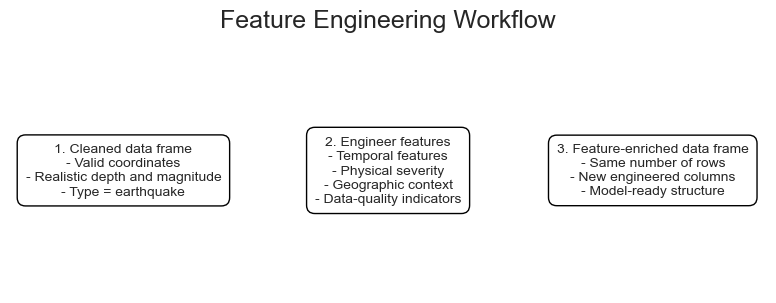

In [56]:
plt = libs.plt

fig, ax = plt.subplots(figsize=(8, 3.2))
ax.axis("off")

def box(x, n, text):
    ax.text(
        x, 0.5, f"{n}. {text}",
        ha="center", va="center",
        fontsize=10,
        bbox=dict(boxstyle="round,pad=0.6", fc="white", ec="black"),
    )

box(0.15, 1,
    """Cleaned data frame
- Valid coordinates
- Realistic depth and magnitude
- Type = earthquake""")
box(0.50, 2,
    """Engineer features
- Temporal features
- Physical severity
- Geographic context
- Data-quality indicators""")
box(0.85, 3,
    """Feature-enriched data frame
- Same number of rows
- New engineered columns
- Model-ready structure""")

plt.title("Feature Engineering Workflow", fontsize=18, pad=15)
plt.tight_layout()

save_matplotlib(fig, "Figure 5 feature engineering workflow.png")
plt.show()


**Figure 5. Feature engineering workflow (2023 USGS, cleaned N=24,432).**
Figure 5 shows the progression from raw catalogue to cleaned data and feature enrichment, clarifying validation and feature-creation stages.

The flow diagram clarifies where filtering stops and feature derivation begins, which supports reproducibility and attribution of model changes. The next cell defines `engineer_features()`.

This lineage also highlights where assumptions enter, which matters when the analysis is re-run on new catalogues.

### 4.1 Design of the `engineer_features()` Function

Each engineered feature maps to a clear seismological concept (depth class, severity, time-of-day, region) and is paired with readable labels for plots and modelling. To avoid target leakage in classification, magnitude and deterministic transforms of magnitude (e.g., `energy_log10_J` and magnitude category) are retained for interpretability and EDA but excluded from the predictor feature set used for model training.


In [57]:


import numpy as np
import pandas as pd
from pandas import DataFrame
from pandas.api.types import is_datetime64_any_dtype, CategoricalDtype

def engineer_features(df: DataFrame) -> DataFrame:
    """Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe."""
    df = df.copy()


    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)

    dt = df["time"].dt
    df["time_str"] = dt.strftime("%Y-%m-%d %H:%M:%S")
    df["year"] = dt.year
    df["month"] = dt.month
    df["month_name"] = dt.month_name()
    df["day"] = dt.day
    df["day_of_week"] = dt.dayofweek
    df["day_name"] = dt.day_name()
    df["hour"] = dt.hour
    df["is_weekend"] = df["day_of_week"].isin([5, 6])

    def hour_to_part(h):
        if h < 6:   return "night"
        if h < 12:  return "morning"
        if h < 18:  return "afternoon"
        return "evening"
    df["part_of_day"] = df["hour"].apply(hour_to_part)

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"
        if m in (3, 4, 5):   return "spring"
        if m in (6, 7, 8):   return "summer"
        return "autumn"
    df["season"] = df["month"].apply(month_to_season)


    depth_cat_type = CategoricalDtype(categories=["shallow", "intermediate", "deep"], ordered=True)
    mag_cat_type = CategoricalDtype(categories=["minor", "light", "moderate", "strong", "major", "great", "massive"], ordered=True)
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=depth_cat_type.categories,
        right=False
    ).astype(depth_cat_type)
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=mag_cat_type.categories,
        right=False
    ).astype(mag_cat_type)
    df["is_strong_quake"] = df["mag"] >= 6.0
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8


    df["abs_latitude"] = df["latitude"].abs()
    df["abs_longitude"] = df["longitude"].abs()
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")

    def classify_region(lon):
        if lon < -100: return "Americas_west"
        if lon < -30:  return "Americas_east_Atlantic"
        if lon < 60:   return "Europe_Africa"
        if lon < 150:  return "Asia_WestPacific"
        return "Pacific_Oceania"
    df["broad_region"] = df["longitude"].apply(classify_region)


    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"
                df[norm_name] = (df[col] - mn) / (mx - mn)
                norm_cols.append(norm_name)
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)


    category_types = {
        "depth_category": depth_cat_type,
        "mag_category": mag_cat_type,
        "hemisphere_NS": CategoricalDtype(categories=["north", "south"]),
        "hemisphere_EW": CategoricalDtype(categories=["east", "west"]),
        "broad_region": CategoricalDtype(categories=["Americas_west", "Americas_east_Atlantic", "Europe_Africa", "Asia_WestPacific", "Pacific_Oceania"]),
        "part_of_day": CategoricalDtype(categories=["night", "morning", "afternoon", "evening"], ordered=True),
        "season": CategoricalDtype(categories=["winter", "spring", "summer", "autumn"], ordered=True),
    }
    for col, cat_type in category_types.items():
        if col in df.columns:
            df[col] = df[col].astype(cat_type)

    for c in category_types:
        if c in df.columns and hasattr(df[c], "cat"):
            cat_series = df[c]
            if "unknown" not in cat_series.cat.categories:
                cat_series = cat_series.cat.add_categories(["unknown"])
            df[c] = cat_series
            df[f"{c}_code"] = cat_series.fillna("unknown").cat.codes

    # Custom logic feature: distance to the nearest plate-boundary point.
    # This uses `Data/Raw/Plate Boundaries.csv` as an approximate geometry proxy.
    try:
        df = eq.add_plate_distance(df, plate_file=PLATE_FILE, out_col="dist_to_plate_km")
    except Exception:
        df["dist_to_plate_km"] = np.nan

    return df

# Feature engineering steps: add temporal fields (year, month, season, part of day), physical
# severity (depth and magnitude categories, energy proxy, strong flag), geographic context
# (hemispheres, coarse region, distances to equator and prime meridian), data-quality signals
# (error presence, normalized scores, composite quality), and categorical encodings for modelling.


if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features


`engineer_features()` adds temporal, physical, spatial, and quality features plus encoded variants, enabling richer comparisons without altering events. It includes a custom proximity proxy (`dist_to_plate_km`) computed from the plate-boundary point cloud; the inventory below makes the full schema explicit.

### 4.2 Engineered Feature Schema Summary

In [58]:
if 'df_clean' not in globals():
    raise NameError('df_clean is missing; run Section 3 first (cleaning).')

pipeline.engineer_fn = engineer_features

df_feat = pipeline.engineer(df_clean)
BASE_EDA_DF = df_feat

# Backwards-compat alias (do not use in new code)
df_feat = df_feat

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km", "dist_to_plate_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}

print("Engineered Feature Schema Summary\n(showing only columns present in df_feat)\n")

Engineered Feature Schema Summary
(showing only columns present in df_feat)



**4.2.1: Engineered feature inventory**

The inventory lists engineered columns by theme to map each plot or model input back to a feature group, while noting that some quality fields are missing for subsets of events. The schema summary below confirms presence and consistency.

The schema summary confirms temporal, spatial, severity, and quality fields and assumes categorical encodings preserve meaningful order, which is acceptable for EDA but can oversimplify modelling. The pipeline check then verifies the row count is preserved.

### 4.3 Feature Engineering Pipeline

In [59]:

print("Applying feature engineering to df_clean...")

original_columns = list(df_clean.columns)

if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features
    df_feat = pipeline.engineer(df_clean)
else:
    df_feat = engineer_features(df_clean)

df_feat = df_feat

print("=== Dataset Shape Comparison ===")
print(f"Before feature engineering : {df_clean.shape}")
print(f"After feature engineering  : {df_feat.shape}")

new_cols = [c for c in df_feat.columns if c not in original_columns]

print(f"Number of engineered features added: {len(new_cols)}")
print("Sample of engineered feature names (first 20):")
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")

print("Preview of engineered dataframe:")
preview_table(df_feat)


BASE_EDA_DF = df_feat


Applying feature engineering to df_clean...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 61)
Number of engineered features added: 39
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - dist_to_plate_km
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
Preview of engineered dataframe:


**Table 4. Engineered dataset preview (feature-enriched schema; N=24,432).**
Table 4 shows the feature-enriched dataset used for EDA and modelling, confirming rows are preserved while columns expand.

In [60]:
# Modelling feature lists (defined once; deterministic)

if 'df_feat' not in globals():
    raise NameError('df_feat missing; run Sections 3-4 first (clean + engineer).')

MODEL_TARGET_COL = 'is_strong_quake'


# Leakage columns: retained for EDA, excluded from predictors.
LEAKAGE_COLS = {MODEL_TARGET_COL, 'mag', 'mag_category', 'energy_log10_J'}
IDENTIFIER_COLS = {'id', 'place', 'time_str'}

WORKFLOW_FIELDS = {'magType', 'magSource', 'locationSource', 'status'}

numeric_candidates = [
    'latitude', 'longitude', 'depth',
    'abs_latitude', 'abs_longitude',
    'distance_from_equator_km', 'distance_from_prime_meridian_km',
    'nst', 'gap', 'dmin', 'rms',
    'depthError', 'magError', 'horizontalError',
    'quality_score',
    'dist_to_plate_km',
]

categorical_candidates_physical = [
    'depth_category',
    'broad_region',
    'hemisphere_NS', 'hemisphere_EW',
    'part_of_day', 'season',
    'is_weekend',
]

numeric_features = [c for c in numeric_candidates if c in df_feat.columns and c not in LEAKAGE_COLS and c not in IDENTIFIER_COLS]
categorical_features = [c for c in categorical_candidates_physical if c in df_feat.columns and c not in LEAKAGE_COLS and c not in IDENTIFIER_COLS]

workflow_feature_cols = [c for c in sorted(WORKFLOW_FIELDS) if c in df_feat.columns and c not in LEAKAGE_COLS and c not in IDENTIFIER_COLS]

MODEL_A_FEATURE_COLS = numeric_features + categorical_features + workflow_feature_cols
MODEL_B_FEATURE_COLS = numeric_features + categorical_features

print('Model features (B, physically grounded):', len(MODEL_B_FEATURE_COLS))
print('Model features (A, +workflow fields):', len(MODEL_A_FEATURE_COLS))
print('Workflow fields included in A:', workflow_feature_cols)


Model features (B, physically grounded): 23
Model features (A, +workflow fields): 27
Workflow fields included in A: ['locationSource', 'magSource', 'magType', 'status']


After running the pipeline, shapes and previews confirm only columns changed and no rows were dropped, supporting reproducibility. The dashboard then provides a high-level sanity check of the engineered distributions.

These checks create an audit trail so later model shifts can be traced back to feature design rather than accidental filtering.

### 4.4 Overview of Engineered Feature Groups

The dashboard aggregates seasonality, magnitude mix, regional counts, and quality distributions to validate engineered features and flag anomalies before deeper analysis.

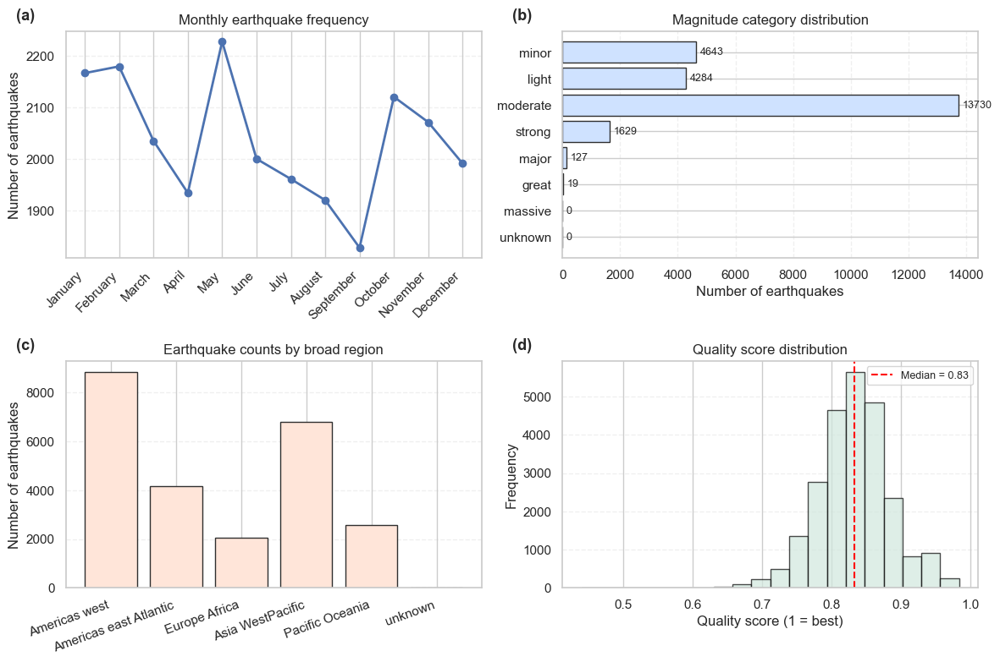

In [61]:

plt = libs.plt
np = libs.np

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
labels = ['(a)', '(b)', '(c)', '(d)']


order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
month_counts = (
    df_feat["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)
x = np.arange(len(order_months))
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)
axes[0].set_title("Monthly earthquake frequency", fontsize=12)
axes[0].set_xticks(x)
axes[0].set_xticklabels(order_months, rotation=45, ha="right")
axes[0].set_ylabel("Number of earthquakes")
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")


mag_counts = (
    df_feat["mag_category"]
    .value_counts()
    .sort_index()
)
y_pos = np.arange(len(mag_counts))
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(mag_counts.index.astype(str))
axes[1].invert_yaxis()
axes[1].set_title("Magnitude category distribution", fontsize=12)
axes[1].set_xlabel("Number of earthquakes")
axes[1].grid(axis="x", linestyle="--", alpha=0.3)
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)


region_counts = (
    df_feat["broad_region"]
    .value_counts()
    .sort_index()
)
x2 = np.arange(len(region_counts))
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")
axes[2].set_xticks(x2)
region_labels = [label.replace("_", " ") for label in region_counts.index.astype(str)]
axes[2].set_xticklabels(region_labels, rotation=20, ha="right")
axes[2].set_title("Earthquake counts by broad region", fontsize=12)
axes[2].set_ylabel("Number of earthquakes")
axes[2].grid(axis="y", linestyle="--", alpha=0.3)
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")


ax = axes[3]
if "quality_score" in df_feat.columns:
    qs = df_feat["quality_score"].dropna()
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")
    median_qs = qs.median()
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")
    ax.set_title("Quality score distribution", fontsize=12)
    ax.set_xlabel("Quality score (1 = best)")
    ax.set_ylabel("Frequency")
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(fontsize=9)
else:
    ax.text(0.5, 0.5, "Quality score not available",
            ha="center", va="center", fontsize=11)
    ax.axis("off")
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")

plt.tight_layout()

save_matplotlib(fig, "Figure 6 engineered feature overview.png")
plt.show()


**Figure 6. Engineered feature groups overview (2023 USGS, cleaned N=24,432).**
Figure 6 shows a dashboard of temporal frequency, magnitude categories, regional counts, and quality scores as a quick validation of engineered features.

The dashboard condenses key indicators into a global overview that is useful for sanity checks but can hide regional heterogeneity. The following visuals therefore examine specific feature relationships.

Monthly counts are steady, smaller magnitude classes dominate, and quality scores cluster high, but regional reporting density shapes these patterns so counts are not hazard rates.

### 4.5 Additional Feature Level Visualisations

The following visuals drill down into specific engineered features to reveal distributional structure that the dashboard cannot show. Each plot targets a single feature group and provides a transition to the broader EDA in Section 5.


#### 4.5.1 Magnitude severity profile

The magnitude category plot highlights the steep decline from minor to strong events, providing a clearer frequency view than the raw histogram.

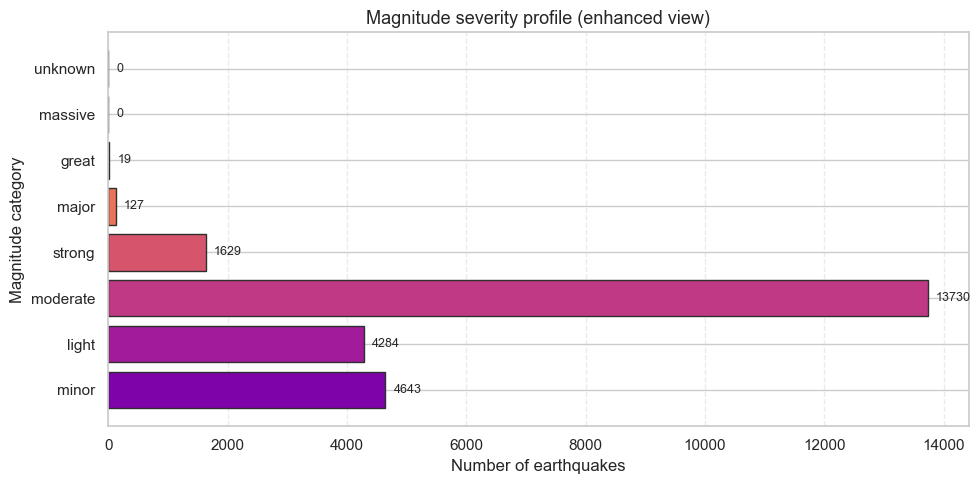

In [62]:

plt = libs.plt
np = libs.np

mag_counts = (
    df_feat["mag_category"]
    .value_counts()
    .sort_index()
)

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))

plt.figure(figsize=(10, 5))
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)
plt.xlabel("Number of earthquakes")
plt.ylabel("Magnitude category")
plt.grid(axis="x", linestyle="--", alpha=0.4)


for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )

plt.tight_layout()

fig = plt.gcf()
save_matplotlib(fig, "Figure 7 magnitude severity profile.png")
plt.show()


**Figure 7. Magnitude severity profile (2023 USGS, cleaned N=24,432).**
Figure 7 shows counts by magnitude category from minor to great, highlighting the steep decline toward strong events.

The severity profile is strongly skewed toward smaller events, which supports threshold-based modelling but is sensitive to detection completeness at higher magnitudes. Depth-stratified plots follow to assess how severity varies with depth class.

Magnitude bins aid communication but are conventional cut-offs, so interpretations focus on broad patterns rather than sharp boundaries.

#### 4.5.2 Magnitude distribution by depth category

This visualisation compares magnitude distributions across shallow, intermediate, and deep classes to capture depth-related differences.

**4.5.2.1: Magnitude distribution by depth category**

Violin plots show shallow events spanning a wider magnitude range while deep events cluster lower, supporting depth class as a categorical predictor. Depth uncertainty increases for deep events, so overlap is interpreted cautiously; the map next adds spatial context.

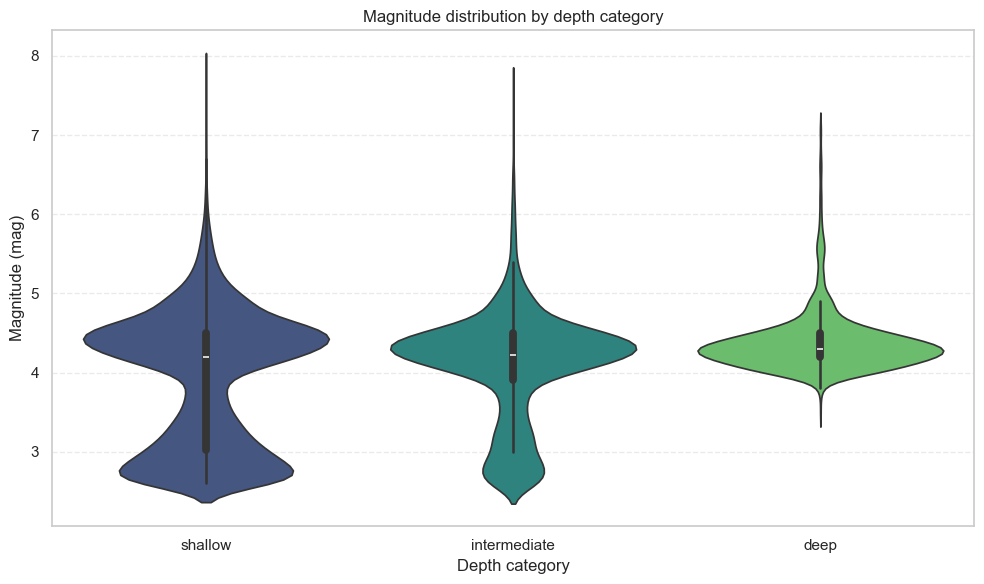

In [63]:

if 'BASE_EDA_DF' not in globals():
    raise NameError('BASE_EDA_DF missing; run Sections 3-4 first (clean + engineer).')

df_plot = BASE_EDA_DF[['depth_category', 'mag']].dropna().copy()

# Enforce engineered depth-category order (no re-creation on raw data)
depth_order = ['shallow', 'intermediate', 'deep']
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(
    data=df_plot,
    x='depth_category',
    y='mag',
    order=depth_order,
    palette='viridis',
    inner='box',
    ax=ax,
)
ax.set_title('Magnitude distribution by depth category')
ax.set_xlabel('Depth category')
ax.set_ylabel('Magnitude (mag)')
ax.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
save_matplotlib(fig, "Figure 8 magnitude distribution by depth.png")
plt.show()


**Figure 8. Magnitude distribution by depth.** Shallow earthquakes span a wider magnitude range, while deep events are more tightly distributed at lower magnitudes in the engineered dataset.

Depth-stratified magnitudes hint at tectonic differences, but coarse regional bins limit mechanism inference; the map adds geographic structure.

Linking depth classes to geography transitions the analysis from statistical separation to physical context and sets up the EDA section.

#### 4.5.3 Global epicentre distribution with magnitude-depth

This map integrates location, depth, and magnitude to provide geographic context for severity patterns and sets up the more detailed epicentre analysis in Section 5.

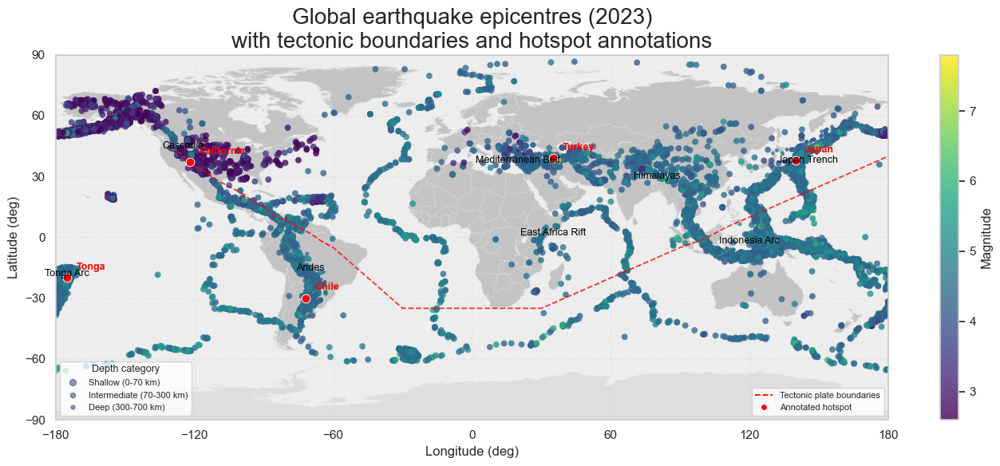

In [64]:

plt = libs.plt
mpimg = libs.mpimg
np = libs.np
pd = libs.pd
Line2D = libs.Line2D

map_path = WORLD_MAP_FILE
plates_path = PLATE_FILE

cropped_img = None
if mpimg is not None and map_path is not None and map_path.exists():
    try:
        img = mpimg.imread(map_path)
        rgb = img[:, :, :3]
        brightness = rgb.mean(axis=2)
        mask = brightness > 0.02
        if mask.any():
            rows = np.where(mask.any(axis=1))[0]
            cols = np.where(mask.any(axis=0))[0]
            cropped_img = np.clip(img[rows[0]:rows[-1], cols[0]:cols[-1]] * 0.9, 0, 1)
    except Exception as exc:
        print(f"Skipping background image: {exc}")
else:
    print("World map image not found; drawing map without a background image.")

plates = None
if plates_path is not None and plates_path.exists():
    try:
        plates = pd.read_csv(plates_path)
    except Exception as exc:
        print(f"Skipping plate boundary overlay: {exc}")
else:
    print("Plate boundary file not found; continuing without boundary overlay.")

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}
marker_sizes = (
    df_feat["depth_category"]
    .map(size_map)
    .astype(float)
    .fillna(14.0)
)

fig, ax = plt.subplots(figsize=(14, 6))

if cropped_img is not None:
    ax.imshow(
        cropped_img,
        extent=[-180, 180, -90, 90],
        aspect="auto",
        alpha=0.75,
        zorder=0,
    )

sc = ax.scatter(
    df_feat["longitude"],
    df_feat["latitude"],
    c=df_feat["mag"],
    s=marker_sizes,
    alpha=0.8,
    cmap="viridis",
    edgecolors="none",
    zorder=2,
)

if plates is not None:
    ax.plot(
        plates["lon"], plates["lat"],
        color="red", linewidth=1.3, linestyle="--",
        alpha=0.8, zorder=3,
    )

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),
    "California": (-122, 37),
}

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)
    ax.text(
        x + 4, y + 4,
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5,
    )

tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )

ax.set_title(
    "Global earthquake epicentres (2023)\nwith tectonic boundaries and hotspot annotations",
    fontsize=20,
)
ax.set_xlabel("Longitude (deg)")
ax.set_ylabel("Latitude (deg)")
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.set_xticks(np.arange(-180, 181, 60))
ax.set_yticks(np.arange(-90, 91, 30))
ax.grid(True, linestyle="--", alpha=0.25)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Magnitude")

depth_legend_elements = [
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["shallow"]),
           label='Shallow (0-70 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["intermediate"]),
           label='Intermediate (70-300 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["deep"]),
           label='Deep (300-700 km)', markerfacecolor='grey', alpha=0.8),
]

depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True,
)
ax.add_artist(depth_legend)

boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3, label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white", label="Annotated hotspot"),
    ],
    loc="lower right",
    fontsize=8,
    frameon=True,
)

plt.tight_layout()

save_matplotlib(fig, "Figure 9 epicentres and plates map.png")
plt.show()


**Figure 9. Epicentres with tectonic boundaries (2023 USGS, cleaned N=24,432).**
Figure 9 shows epicentres overlaid on plate boundaries with annotated hotspots, linking depth and magnitude cues to tectonic structure.

### 4.6 Summary and Reflection

Feature engineering enriches the cleaned catalogue with interpretable temporal, spatial, severity, and quality indicators without altering event rows. This preparation enables deeper EDA and supports the classification models that follow. The explicit design choices (depth categories and strong-event thresholds) make the analysis assumptions transparent.

---

## 5. Exploratory Data Analysis

This section synthesizes global spatial patterns, depth and magnitude structure, and regional contrasts using the engineered dataset. The emphasis is on interpretable evidence: maps, distributions, correlations, and quality diagnostics that explain the shape of the data before modelling.


**5.1: Global tectonic context map**

The global map aligns epicentres with plate boundaries to anchor EDA in physical geography, but density also reflects station coverage. Quantitative summaries follow to reduce reliance on visual density.

### 5.1 Global Patterns

Global patterns show shallow-event dominance and plate-boundary clustering. The diagnostics below check magnitude/depth structure, station coverage, and temporal reporting to ground later analyses in data quality.

**5.1.1: EDA dependency status**

Dependency checks ensure EDA outputs remain reproducible across environments, with interactive or static fallbacks as needed.

In [65]:
# EDA / modelling dependency status
libs.availability()


{'HAS_MATPLOTLIB': True,
 'HAS_SEABORN': True,
 'HAS_PLOTLY': True,
 'HAS_KALEIDO': True,
 'HAS_SKLEARN': True,
 'HAS_SCIPY': True}

**5.1.2: Magnitude density by depth category (KDE)**

KDE curves compare magnitude distributions across depth classes, indicating broader ranges for shallow events and tighter distributions at depth. The smoothing bandwidth can blur sharp differences, so results are trend indicators rather than precise distributions.

Overlap between curves shows depth alone cannot separate strong events, implying models must integrate magnitude and quality features.

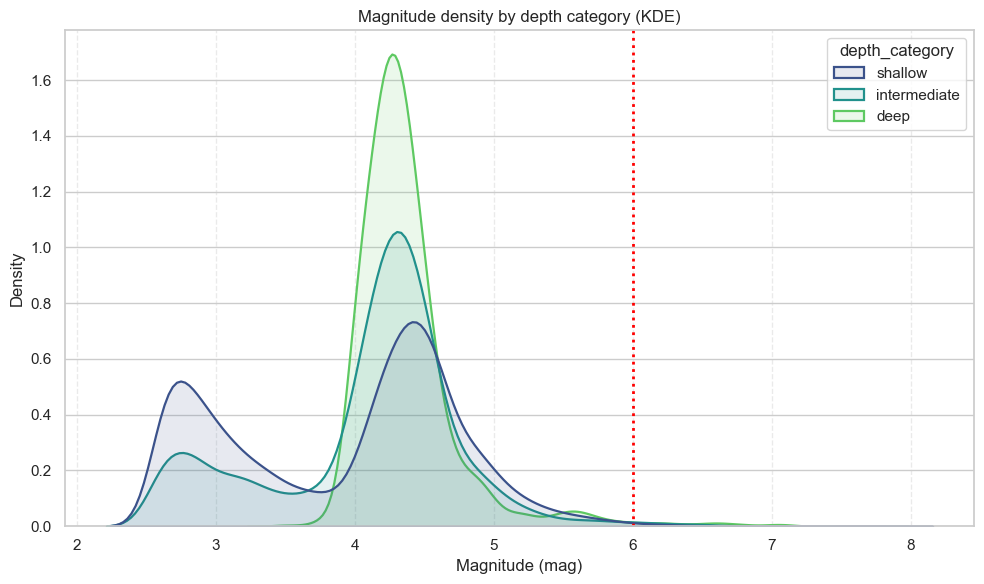

In [66]:

if 'BASE_EDA_DF' not in globals():
    raise NameError('BASE_EDA_DF missing; run Sections 3-4 first (clean + engineer).')

df_kde = BASE_EDA_DF[['mag', 'depth_category']].dropna().copy()
depth_order = ['shallow', 'intermediate', 'deep']

fig, ax = plt.subplots(figsize=(10, 6))
sns.kdeplot(
    data=df_kde,
    x='mag',
    hue='depth_category',
    hue_order=depth_order,
    palette='viridis',
    common_norm=False,
    linewidth=1.6,
    fill=True,
    alpha=0.12,
    ax=ax,
)
ax.axvline(6.0, color='red', linestyle=':', linewidth=2)
ax.set_title('Magnitude density by depth category (KDE)')
ax.set_xlabel('Magnitude (mag)')
ax.set_ylabel('Density')
ax.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
save_matplotlib(fig, "Figure 10 magnitude density by depth KDE.png")
plt.show()


**Figure 10. Magnitude density by depth category (KDE).** KDE curves show broad shallow-event magnitudes and tighter deep-event distributions, with substantial overlap across depth classes.

**5.1.3: Depth distribution sanity check**

Depth histograms confirm shallow dominance and validate cleaning bounds while flagging higher uncertainty for rare deep events. Station-coverage metrics add context for observational support.

These diagnostics frame deep-event uncertainty before the station-based quality checks.

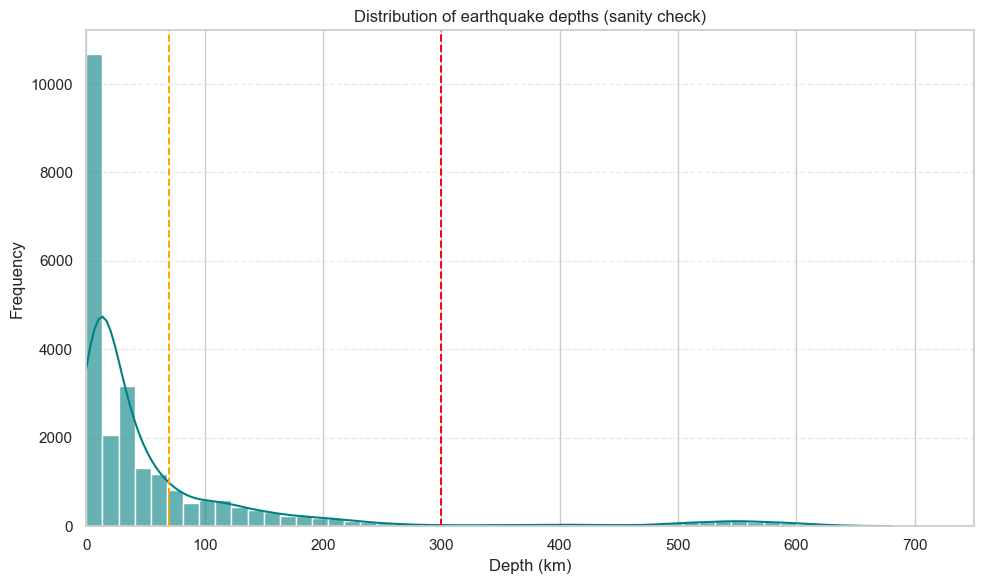

In [67]:

if 'BASE_EDA_DF' not in globals():
    raise NameError('BASE_EDA_DF missing; run Sections 3-4 first (clean + engineer).')

df_depth = BASE_EDA_DF[['depth']].dropna().copy()

fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(df_depth['depth'], bins=50, kde=True, color='teal', alpha=0.6, ax=ax)
ax.axvline(70, color='orange', linestyle='--', linewidth=1.4)
ax.axvline(300, color='red', linestyle='--', linewidth=1.4)
ax.set_title('Distribution of earthquake depths (sanity check)')
ax.set_xlabel('Depth (km)')
ax.set_ylabel('Frequency')
ax.set_xlim(0, 750)
ax.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
save_matplotlib(fig, "Figure 11 depth distribution sanity check.png")
plt.show()


**Figure 11. Distribution of earthquake depths (sanity check).** The engineered dataset is dominated by shallow events with a long tail into intermediate and deep regimes, consistent with the cleaning depth window.

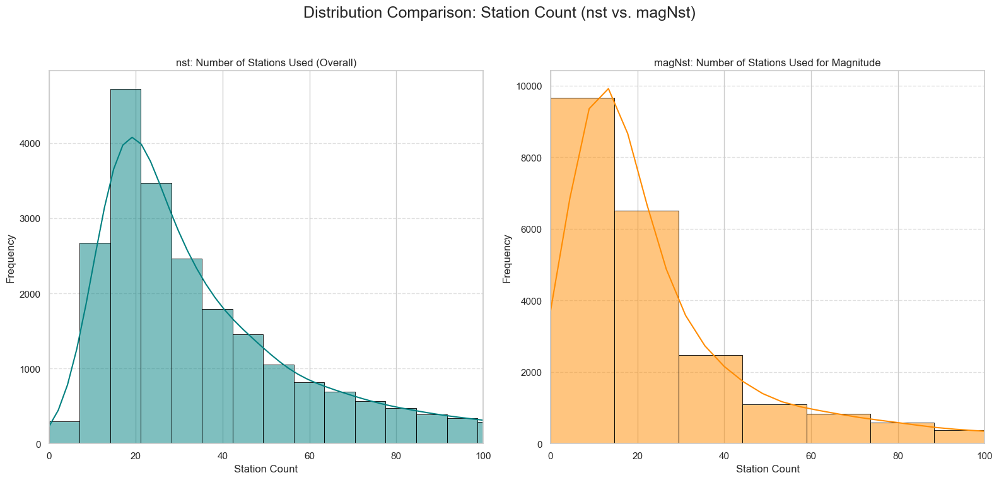

In [68]:



nst_data = BASE_EDA_DF['nst'].dropna()
magNst_data = BASE_EDA_DF['magNst'].dropna()

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)

max_limit = 100
bins_count = 60

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)
axes[0].set_title('nst: Number of Stations Used (Overall)')
axes[0].set_xlabel('Station Count')
axes[0].set_ylabel('Frequency')
axes[0].set_xlim(0, max_limit)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)
axes[1].set_title('magNst: Number of Stations Used for Magnitude')
axes[1].set_xlabel('Station Count')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, max_limit)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

save_matplotlib(fig, "Figure 12 station coverage diagnostics.png")
plt.show()


**Figure 12. Station-coverage diagnostics (2023 USGS, cleaned N=24,432).**
Figure 12 shows station counts for location and magnitude (nst, magNst), indicating variations in network support that can affect data quality.

**5.1.4: Station count distributions**

Station counts proxy observational support and highlight events with weaker coverage, but the proxy can be biased by network geometry and noise conditions. The nearest-station distance offers a complementary check.

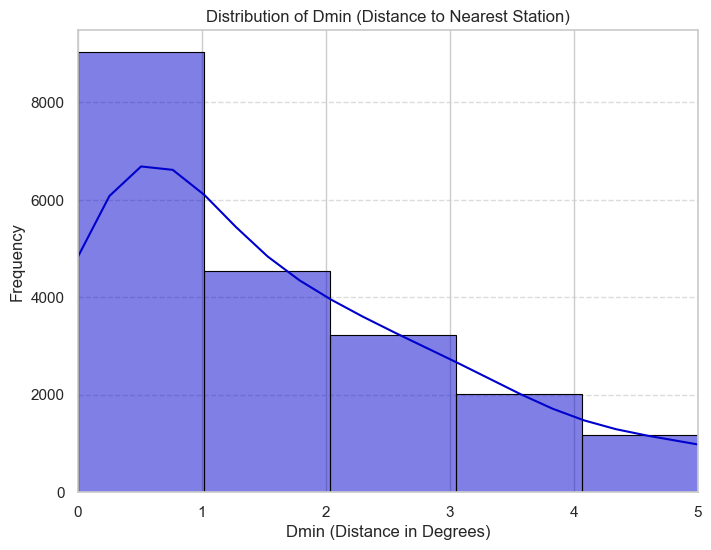

In [69]:



dmin_data = BASE_EDA_DF['dmin'].dropna()

plt = libs.plt
sns = libs.sns

plt.figure(figsize=(8, 6))

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)

plt.xlim(0, 5)

plt.title('Distribution of Dmin (Distance to Nearest Station)')
plt.xlabel('Dmin (Distance in Degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)

fig = plt.gcf()
save_matplotlib(fig, "Figure 13 nearest station distance.png")
plt.show()


**Figure 13. Nearest-station distance (2023 USGS, cleaned N=24,432).**
Figure 13 shows the distribution of dmin (nearest-station distance); shorter distances indicate stronger coverage and lower uncertainty.

**5.1.5: Nearest station distance distribution**

The dmin distribution shows most events near stations with a long tail of weak coverage, which should be read as observational context rather than physics. Temporal patterns are checked next to rule out reporting artefacts.

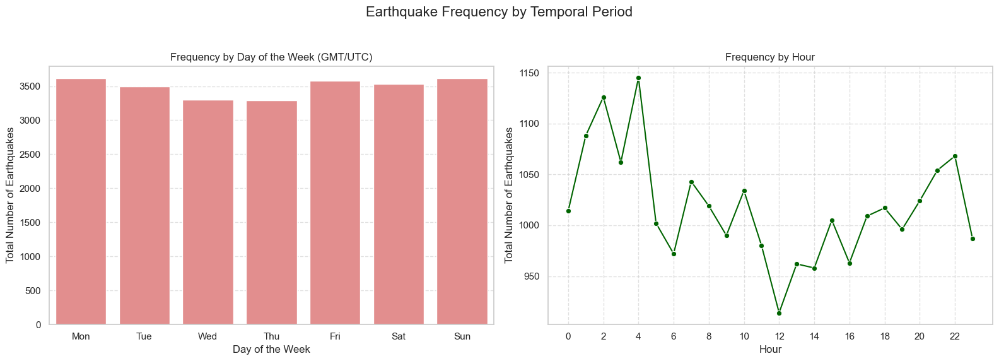

In [70]:



df_time = BASE_EDA_DF[['time']].copy()
df_time['time'] = pd.to_datetime(df_time['time'], utc=True, errors='coerce')
df_time['day_of_week'] = df_time['time'].dt.dayofweek
df_time['hour_of_day'] = df_time['time'].dt.hour

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_counts = df_time['day_of_week'].value_counts().sort_index()

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Total Number of Earthquakes')
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(day_labels)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

hour_counts = df_time['hour_of_day'].value_counts().sort_index()
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')
axes[1].set_title('Frequency by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Total Number of Earthquakes')
axes[1].set_xticks(range(0, 24, 2))
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

save_matplotlib(fig, "Figure 14 temporal reporting patterns.png")
plt.show()


**Figure 14. Temporal reporting patterns (2023 USGS, cleaned N=24,432).**
Figure 14 shows event counts by weekday and hour (UTC); any modest periodicity likely reflects reporting cadence rather than physical seasonality.

**5.1.6: Temporal event frequency (weekday and hour)**

Weekday and hour profiles are largely flat, so temporal features are descriptive rather than causal and may reflect reporting cadence. They are retained for modelling but interpreted cautiously; correlations are examined next.

### 5.2 Multivariate & Regional

These plots explore interactions among magnitude, depth, region, and quality to inform feature selection.

#### 5.2.1 Inter-feature correlation

The correlation heatmap summarizes linear relationships among numeric variables and confirms no single predictor trivially encodes the target. Magnitude and depth are weakly correlated, while uncertainty metrics co-vary as expected, supporting a distinct quality feature group.

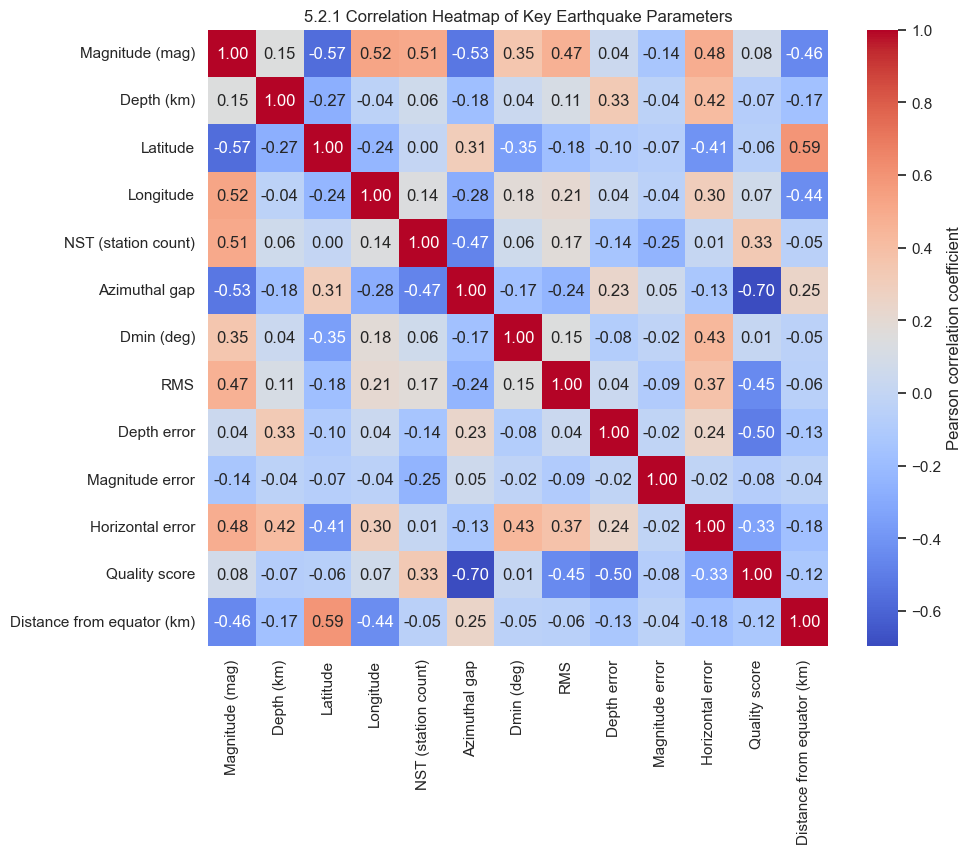

In [71]:
pd = libs.pd
plt = libs.plt
sns = libs.sns

df = globals().get('BASE_EDA_DF', globals().get('BASE_EDA_DF'))

correlation_features = [
    'mag',
    'depth',
    'latitude',
    'longitude',
    'nst',
    'gap',
    'dmin',
    'rms',
    'depthError',
    'magError',
    'horizontalError',
    'quality_score',
    'distance_from_equator_km'  # Engineered feature
]

present_features = [f for f in correlation_features if f in df.columns]

label_map = {
    'mag': 'Magnitude (mag)',
    'depth': 'Depth (km)',
    'latitude': 'Latitude',
    'longitude': 'Longitude',
    'nst': 'NST (station count)',
    'gap': 'Azimuthal gap',
    'dmin': 'Dmin (deg)',
    'rms': 'RMS',
    'depthError': 'Depth error',
    'magError': 'Magnitude error',
    'horizontalError': 'Horizontal error',
    'quality_score': 'Quality score',
    'distance_from_equator_km': 'Distance from equator (km)',
}

corr_matrix = df[present_features].corr()
corr_matrix = corr_matrix.rename(index=label_map, columns=label_map)

plt.figure(figsize=(10, 8))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    cbar_kws={'label': 'Pearson correlation coefficient'}
)

plt.title('5.2.1 Correlation Heatmap of Key Earthquake Parameters')
plt.show()


**Figure 15. Correlation heatmap (2023 USGS, cleaned N=24,432).**
Figure 15 shows correlations among selected numeric variables, highlighting modest relationships rather than strong collinearity.

The modest correlations suggest limited linear redundancy, although non-linear dependencies may still exist and can be captured by tree-based models. Magnitude-depth comparisons below clarify overlap directly.

#### 5.2.2 Magnitude vs Depth

A paired scatter and depth-class distributions examine magnitude versus depth, showing substantial overlap but a slight shift toward lower magnitudes at greater depths. Pearson r remains near zero, indicating weak linear dependence at the global scale.

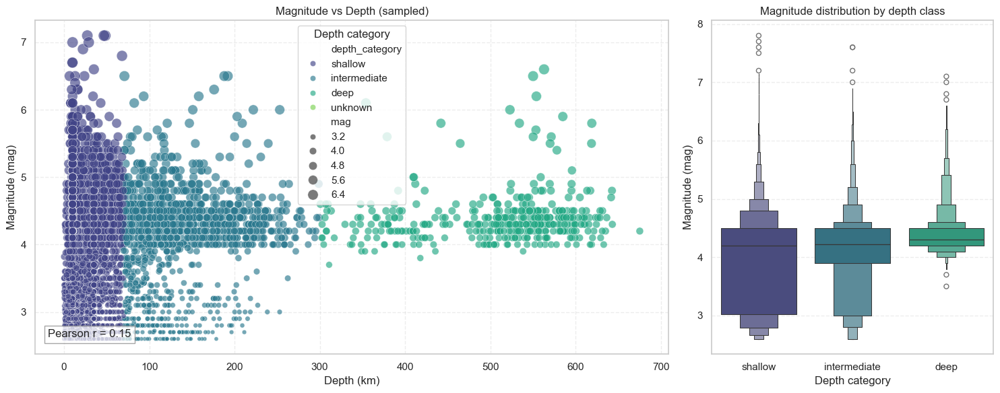

In [72]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

depth_mag_df = BASE_EDA_DF[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 5.2.1.")

sample_limit = 8000
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]
depth_order = depth_order if depth_order else None
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})
sns.scatterplot(
    data=plot_df,
    x="depth",
    y="mag",
    hue="depth_category",
    size="mag",
    sizes=(20, 140),
    palette="viridis",
    alpha=0.65,
    ax=axes[0]
)
axes[0].set_title("Magnitude vs Depth (sampled)")
axes[0].set_xlabel("Depth (km)")
axes[0].set_ylabel("Magnitude (mag)")
axes[0].grid(True, linestyle="--", alpha=0.35)
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)


legend0 = axes[0].get_legend()
if legend0 is not None:
    legend0.set_title("Depth category")
sns.boxenplot(
    data=depth_mag_df,
    x="depth_category",
    y="mag",
    hue="depth_category",
    order=depth_order,
    palette="viridis",
    dodge=False,
    ax=axes[1]
)
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()
axes[1].set_title("Magnitude distribution by depth class")
axes[1].set_xlabel("Depth category")
axes[1].set_ylabel("Magnitude (mag)")
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()
save_matplotlib(fig, "Figure 16 magnitude vs depth.png")
plt.show()

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())
    )
)
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})
# depth_summary is exported in Appendix or can be inspected interactively if needed


**Figure 16. Magnitude vs depth (2023 USGS, cleaned N=24,432).**
Figure 16 shows a sampled magnitude-depth scatter and depth-class distributions, with a weak global relationship and subtle class differences.

Overlap cautions against deterministic interpretations and supports retaining both continuous and categorical depth features alongside quality and region indicators.

Depth-bin aggregates show overlapping interquartile ranges, so depth contributes signal but is insufficient alone. This motivates the regional and quality analyses in Section 5.2.

#### 5.2.3 Global Spatial Distribution (Epicentre Map)

An interactive globe (with static fallback) shows epicentres scaled by magnitude and colored by depth, bridging global patterns and regional summaries.

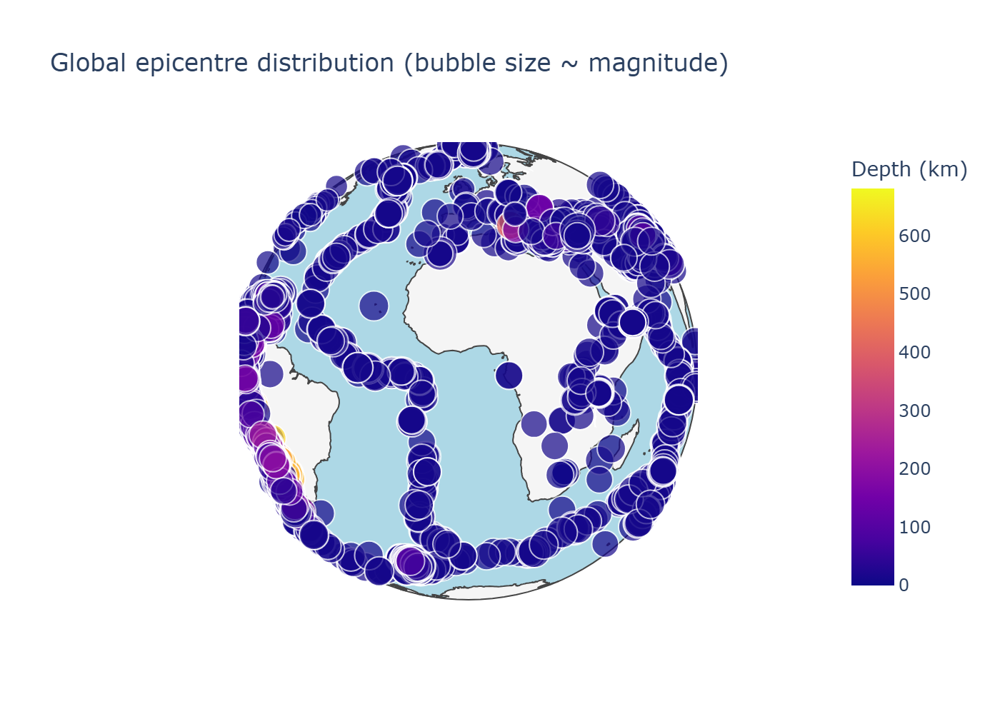

In [73]:

from pandas.api.types import is_datetime64_any_dtype
from IPython.display import HTML, Image, display

px = libs.px
plt = libs.plt
pd = libs.pd
np = libs.np

map_df = BASE_EDA_DF.copy()
if "time" in map_df.columns:
    time_col = map_df["time"]
    if not is_datetime64_any_dtype(time_col):
        time_col = pd.to_datetime(time_col, errors="coerce", utc=True)
    map_df["time_str"] = time_col.dt.strftime("%Y-%m-%d %H:%M:%S")

if "broad_region" in map_df.columns:
    map_df = map_df.copy()
    map_df["broad_region_label"] = map_df["broad_region"].astype(str).str.replace("_", " ")

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "broad_region_label", "depth", "place", "time_str"]
available_cols = [c for c in map_cols if c in map_df.columns]
map_df = map_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 5.2.2.")

map_df["place"] = map_df["place"].fillna("Unknown location")
map_df["mag_size"] = np.clip(map_df["mag"], 3, None)
map_df["is_strong"] = map_df["mag"] >= 6.0
map_df["hover_label"] = (
    map_df["place"]
    + " | mag " + map_df["mag"].round(1).astype(str)
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"
 )

fig = None
if px is not None:
    import plotly.io as pio
    pio.renderers.default = "notebook_connected"
    labels = {
        "depth": "Depth (km)",
        "mag": "Magnitude (mag)",
        "mag_category": "Magnitude category",
        "broad_region_label": "Broad region",
        "time_str": "Event time (UTC)",
    }
    fig = px.scatter_geo(
        map_df,
        lat="latitude",
        lon="longitude",
        color="depth",
        size="mag_size",
        size_max=18,
        hover_name="place",
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region_label":True, "time_str":True},
        projection="orthographic",
        template="plotly_white",
        title="Global epicentre distribution (bubble size ~ magnitude)",
        labels=labels,
    )
    fig.update_layout(legend_title_text="Depth (km)")
    fig.update_geos(showocean=True, oceancolor="lightblue", showland=True, landcolor="whitesmoke")
    html = fig.to_html(full_html=False, include_plotlyjs="embed")
    display(HTML(html))
else:
    fig, ax = plt.subplots(figsize=(14, 7))
    scatter = ax.scatter(
        map_df["longitude"],
        map_df["latitude"],
        c=map_df["mag"],
        cmap="plasma",
        s=np.square(map_df["mag_size"]) * 1.5,
        alpha=0.6,
        linewidths=0.15,
        edgecolor="black",
    )
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.grid(True, linestyle="--", alpha=0.3)
    plt.colorbar(scatter, ax=ax, label="Magnitude (mag)")

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),
        pct_strong=("strong_pct", "mean"),
        median_depth=("depth", "median"),
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_strong"] = region_summary["pct_strong"] * 100
region_summary = region_summary.round({"events": 0, "pct_global": 1, "pct_strong": 1, "median_depth": 0})
# region_summary is exported to CSV (see Data/Processed/Tables/region summary section5 2.csv)

export_epicentre_outputs = True
if export_epicentre_outputs:
    MAPS_DIR.mkdir(parents=True, exist_ok=True)
    TABLES_DIR.mkdir(parents=True, exist_ok=True)

    region_summary.to_csv(TABLES_DIR / "region summary section5 2.csv")
    png_path = MAPS_DIR / "epicentre map section5 2.png"
    if px is not None and fig is not None:
        fig.write_html(MAPS_DIR / "epicentre map section5 2.html", include_plotlyjs="embed")
        if libs.HAS_KALEIDO:
            try:
                fig.write_image(png_path, scale=2)
            except Exception as exc:
                print(f"Plotly static export failed: {exc}")
        else:
            print('Kaleido not available; skipping static PNG export (install from Instructions/Requirements.txt).')
    elif fig is not None:
        fig.savefig(png_path, dpi=300, bbox_inches="tight")

    if png_path.exists():
        display(Image(filename=str(png_path)))


**Figure 17. Plotly epicentre map with PNG fallback (2023 USGS, cleaned N=24,432).**
Figure 17 shows an interactive global epicentre map with a static PNG fallback, emphasizing plate-boundary clustering and depth variation.

**5.2.3.1: Epicentre map and regional summary**

This cell generates the epicentre map and regional summary table, exporting CSV/HTML/PNG for reproducibility with interactive or static fallbacks. Regional bins are coarse, so fine-scale tectonic boundaries are smoothed; the notes below interpret map and table together.

Hover details enable quick checks of extreme events, but outliers can reflect reporting errors and should be verified before interpretation.

The regional summary quantifies event share and strong-event proportions and is exported for transparency and reuse. Coarse regions are a limitation, so results are treated as broad patterns before moving to the regional severity comparison.

**5.2.3.2: Plate-boundary proximity summary (custom feature)**

`dist_to_plate_km` measures the great-circle distance from each epicentre to the nearest plate-boundary point in `Data/Raw/Plate Boundaries.csv`. This is an approximate proxy (the boundary file is a point cloud, not a full tectonic model), so results are interpreted as contextual rather than causal.


In [74]:
# Plate-boundary proximity summary (Table 5)

if 'BASE_EDA_DF' not in globals():
    raise NameError('BASE_EDA_DF is missing; run Sections 3-4 first.')

if 'dist_to_plate_km' not in BASE_EDA_DF.columns:
    raise NameError('dist_to_plate_km missing; ensure engineer_features() includes plate proximity.')

_df = BASE_EDA_DF.copy()
_df['is_strong_quake'] = _df.get('is_strong_quake', _df['mag'] >= 6.0)

valid = _df.dropna(subset=['dist_to_plate_km']).copy()
if valid.empty:
    print('Plate distance unavailable (missing plate file or no valid points).')
    plate_distance_summary = pd.DataFrame()
else:
    def iqr(x):
        return float(x.quantile(0.75) - x.quantile(0.25))

    plate_distance_summary = (
        valid.groupby('is_strong_quake')
        .agg(
            events=('dist_to_plate_km', 'size'),
            median_km=('dist_to_plate_km', 'median'),
            iqr_km=('dist_to_plate_km', iqr),
            mean_km=('dist_to_plate_km', 'mean'),
        )
        .rename(index={False: 'Not strong (mag < 6.0)', True: 'Strong (mag >= 6.0)'})
        .round({'median_km': 1, 'iqr_km': 1, 'mean_km': 1})
    )

    out_path = TABLES_DIR / 'plate distance summary.csv'
    plate_distance_summary.to_csv(out_path)
    print('Saved:', out_path)

plate_distance_summary


Saved: E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Processed\Tables\plate distance summary.csv


,events,median_km,iqr_km,mean_km
is_strong_quake,,,,
Not strong (mag < 6.0),24286,1907.1,2044.7,2613.4
Strong (mag >= 6.0),146,2213.0,4159.4,3184.4


**Table 5. Plate-boundary proximity summary (2023 USGS, cleaned N=24,432).**
Table 5 summarises `dist_to_plate_km` for strong vs non-strong events. The plate-boundary file is an approximate geometry proxy, so differences are interpreted as tectonic context indicators rather than causal effects.


#### 5.2.4 Regional Seismicity Comparisons

Regional summaries compare counts, strong-event share, and depth mix to reveal heterogeneity masked by global averages.

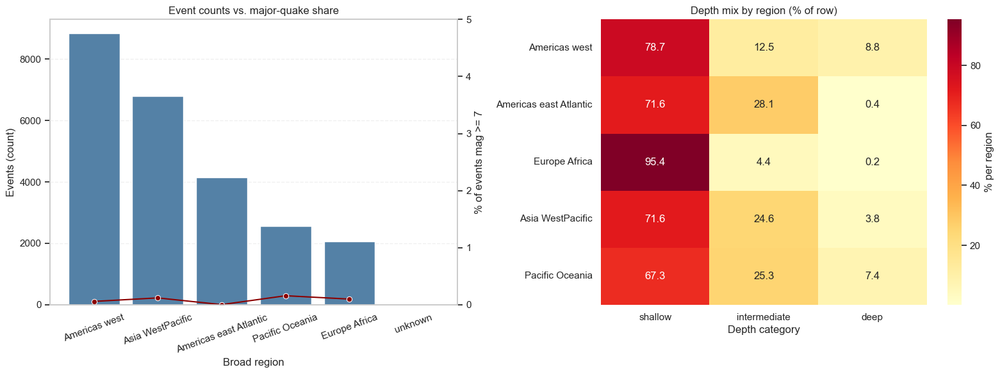

In [75]:

sns = libs.sns
pd = libs.pd
plt = libs.plt

region_cols = ["broad_region", "mag", "depth", "depth_category"]
region_cols = [c for c in region_cols if c in BASE_EDA_DF.columns]
region_df = BASE_EDA_DF[region_cols].dropna(subset=["broad_region", "mag"]).copy()
if region_df.empty:
    raise ValueError("No regional samples available for Section 5.2.3.")

region_df["is_major"] = region_df["mag"] >= 7.0

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),
        pct_major=("is_major", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_major"] = region_summary["pct_major"] * 100
region_plot = region_summary.reset_index()

region_plot["region_label"] = region_plot["broad_region"].astype(str).str.replace("_", " ")

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100

if not depth_mix.empty:
    depth_mix.index = depth_mix.index.to_series().astype(str).str.replace("_", " ")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(data=region_plot, x="region_label", y="events", color="steelblue", ax=axes[0])
axes[0].set_title("Event counts vs. major-quake share")
axes[0].set_xlabel("Broad region")
axes[0].set_ylabel("Events (count)")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)

ax2 = axes[0].twinx()
sns.lineplot(data=region_plot, x="region_label", y="pct_major", marker="o", color="darkred", ax=ax2)
ax2.set_ylabel("% of events mag >= 7")
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))
ax2.grid(False)

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)
    axes[1].axis("off")
else:
    sns.heatmap(
        depth_mix,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        cbar_kws={"label": "% per region"},
        ax=axes[1]
    )
    axes[1].set_title("Depth mix by region (% of row)")
    axes[1].set_xlabel("Depth category")
    axes[1].set_ylabel("")

plt.tight_layout()
save_matplotlib(fig, "Figure 18 regional seismicity comparisons.png")
plt.show()

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})
region_summary_display = region_summary.copy()
region_summary_display.index = region_summary_display.index.to_series().astype(str).str.replace("_", " ")
# region_summary table omitted from inline output (see plotted summaries and exports)


**Figure 18. Regional seismicity comparisons (2023 USGS, cleaned N=24,432).**
Figure 18 shows regional contrasts in event counts, strong-event share, and depth composition, revealing heterogeneity masked by global averages.

**5.2.4.1: Regional severity comparison**

Regional comparisons show that high counts do not necessarily imply higher strong-event share, which matters for model interpretation. Uneven reporting and small sample sizes limit precision, so region is treated as contextual rather than deterministic.

This motivates regional indicators in the classifier while cautioning against tectonic overinterpretation; quality analysis follows.

#### 5.2.5 Quality Score & Uncertainty Analysis

The composite quality score aggregates gap, RMS, and uncertainty into a 0-1 index (1 = best) to assess measurement reliability across the catalogue.

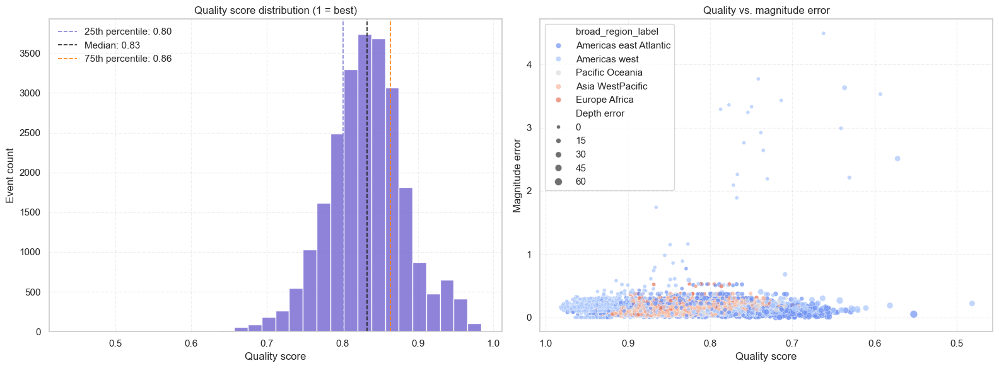

(                        events  mean quality  p10 quality  p90 quality  \
 broad_region                                                             
 Europe Africa             2061         0.852        0.805        0.895   
 Asia WestPacific          6797         0.837        0.792        0.880   
 Americas west             8852         0.831        0.760        0.936   
 Americas east Atlantic    4156         0.824        0.748        0.885   
 Pacific Oceania           2566         0.823        0.769        0.873   
 unknown                      0           NaN          NaN          NaN   
 
                         median magError  median depthError  \
 broad_region                                                 
 Europe Africa                     0.110              1.919   
 Asia WestPacific                  0.113              4.751   
 Americas west                     0.115              2.000   
 Americas east Atlantic            0.100              3.742   
 Pacific Oceania    

In [76]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]
quality_cols = [c for c in quality_base_cols if c in BASE_EDA_DF.columns]
quality_df = BASE_EDA_DF[quality_cols].dropna(subset=["quality_score"]).copy()
if quality_df.empty:
    raise ValueError("quality_score not available for Section 5.2.4.")

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(
    data=quality_df,
    x="quality_score",
    bins=30,
    color="slateblue",
    edgecolor="white",
    ax=axes[0]
)
axes[0].set_title("Quality score distribution (1 = best)")
axes[0].set_xlabel("Quality score")
axes[0].set_ylabel("Event count")
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")
axes[0].legend(loc="best", frameon=False)
axes[0].grid(True, linestyle="--", alpha=0.3)

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]
scatter_df = quality_df[scatter_cols].dropna()
scatter_df = scatter_df.copy()
if "broad_region" in scatter_df.columns:
    scatter_df["broad_region_label"] = scatter_df["broad_region"].astype(str).str.replace("_", " ")
if "depthError" in scatter_df.columns:
    scatter_df["Depth error"] = scatter_df["depthError"]
axes[1].set_title("Quality vs. magnitude error")
axes[1].set_xlabel("Quality score")
axes[1].set_ylabel("Magnitude error")
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)
    axes[1].grid(False)
else:
    hue_col = "broad_region_label" if "broad_region_label" in scatter_df.columns else None
    size_col = "Depth error" if "Depth error" in scatter_df.columns else None
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )
    axes[1].grid(True, linestyle="--", alpha=0.3)
    axes[1].invert_xaxis()
    axes[1].legend(loc="best")

plt.tight_layout()
save_matplotlib(fig, "Figure 19 quality score and uncertainty.png")
plt.show()

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())
region_quality = region_quality.sort_values("mean_quality", ascending=False)
region_quality = region_quality.round(3)

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]


region_quality_display = region_quality.copy()
region_quality_display.index = region_quality_display.index.str.replace("_", " ")
region_quality_display.columns = [c.replace("_", " ") for c in region_quality_display.columns]

low_quality_display = low_quality_events.copy()
low_quality_display.columns = [c.replace("_", " ") for c in low_quality_display.columns]
low_quality_display = low_quality_display.rename_axis(None)

region_quality_display, low_quality_display


**Figure 19. Quality score and uncertainty (2023 USGS, cleaned N=24,432).**
Figure 19 shows the quality-score distribution and its relationship to magnitude uncertainty, clarifying reliability variation across the catalogue.

**5.2.5.1: Quality score and uncertainty analysis**

Quality scores cluster high with a low-quality tail, and regional aggregation shows systematic differences that inform model interpretation. Because the score is a composite, it is a relative indicator rather than a precise error bound.

Low-quality tails are flagged so model errors are interpreted with caution, bridging into the modelling section.

---

## 6. Strong Quake Classification

This section frames the catalogue as a *supervised classification* task: identify whether a recorded event is a **strong** earthquake (mag >= 6.0) using engineered, interpretable predictors. This is a post-event catalogue classifier (not a hazard forecast model). Because strong events are rare (~0.6%), evaluation prioritises precision-recall behaviour rather than accuracy alone.


### 6.1 Data split, pipeline, and models

- **Target:** `is_strong_quake = (mag >= 6.0)`
- **Imbalance:** handled via `class_weight='balanced'`
- **Models:** logistic regression (interpretable baseline) and random forest (non-linear baseline)
- **Metric focus:** average precision (AP), plus recall/precision trade-offs


In [77]:
# Modelling prerequisites
ensure_modelling_deps(verbose=True)


Dependency status: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [78]:
# Train/evaluate baseline models (rare-event setting)

from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from sklearn.metrics import (
    precision_recall_curve,
    average_precision_score,
    roc_auc_score,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)
from sklearn.calibration import calibration_curve
from sklearn.metrics import brier_score_loss
from sklearn.metrics import auc as sk_auc
from pandas import DataFrame

if 'df_feat' not in globals() or 'BASE_EDA_DF' not in globals():
    raise NameError('df_feat/BASE_EDA_DF missing. Run Sections 3-4 first (clean + engineer).')

model_df = df_feat.copy()
TARGET_COL = globals().get('MODEL_TARGET_COL', 'is_strong_quake')
if TARGET_COL not in model_df.columns:
    model_df[TARGET_COL] = (model_df['mag'] >= 6.0)

y = model_df[TARGET_COL].astype(int)

if 'MODEL_B_FEATURE_COLS' not in globals() or 'MODEL_A_FEATURE_COLS' not in globals():
    raise NameError('MODEL_A_FEATURE_COLS / MODEL_B_FEATURE_COLS missing; run the feature list cell after Section 4.')

X_A = model_df[MODEL_A_FEATURE_COLS].copy()
X_B = model_df[MODEL_B_FEATURE_COLS].copy()

# Defensive typing
for col in X_A.columns:
    if pd.api.types.is_numeric_dtype(model_df[col]):
        X_A[col] = pd.to_numeric(X_A[col], errors='coerce')
for col in X_B.columns:
    if pd.api.types.is_numeric_dtype(model_df[col]):
        X_B[col] = pd.to_numeric(X_B[col], errors='coerce')

X_train_A, X_test_A, y_train, y_test = train_test_split(
    X_A, y, test_size=0.2, stratify=y, random_state=int(globals().get('RANDOM_SEED', 42))
)
X_train_B = X_B.loc[X_train_A.index]
X_test_B = X_B.loc[X_test_A.index]


def build_preprocess(X_frame: DataFrame):
    num_cols = [c for c in X_frame.columns if pd.api.types.is_numeric_dtype(X_frame[c])]
    cat_cols = [c for c in X_frame.columns if c not in num_cols]

    num_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    cat_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore')),
    ])
    preprocess = ColumnTransformer([
        ('num', num_pipe, num_cols),
        ('cat', cat_pipe, cat_cols),
    ])
    return preprocess


def threshold_max_precision_at_recall(y_true, y_prob, target_recall: float = 0.80):
    precision, recall, thresholds = precision_recall_curve(y_true, y_prob)
    candidates = []
    for p, r, t in zip(precision[:-1], recall[:-1], thresholds):
        if r >= target_recall:
            candidates.append((float(t), float(p), float(r)))
    if not candidates:
        return 0.5, float('nan'), float('nan')
    t_best, p_best, r_best = max(candidates, key=lambda x: (x[1], x[0]))
    return t_best, p_best, r_best


def best_f1_threshold(y_true, y_prob):
    precision, recall, thresholds = precision_recall_curve(y_true, y_prob)
    f1 = 2 * precision * recall / (precision + recall + 1e-12)
    best_idx = int(f1[:-1].argmax())
    t = float(thresholds[best_idx])
    return t, float(precision[best_idx]), float(recall[best_idx]), float(f1[best_idx])


TARGET_RECALL = 0.80

pre_B = build_preprocess(X_train_B)
pre_A = build_preprocess(X_train_A)

log_reg = Pipeline([
    ('preprocess', pre_B),
    ('clf', LogisticRegression(
        solver='lbfgs',
        max_iter=2000,
        C=1.0,
        class_weight='balanced',
        random_state=int(globals().get('RANDOM_SEED', 42)),
    )),
])

forest_params = dict(
    n_estimators=250,
    max_depth=None,
    min_samples_leaf=3,
    max_features='sqrt',
    class_weight='balanced_subsample',
    random_state=int(globals().get('RANDOM_SEED', 42)),
    n_jobs=1,
)

forest_A = Pipeline([
    ('preprocess', pre_A),
    ('clf', RandomForestClassifier(**forest_params)),
])

forest_B = Pipeline([
    ('preprocess', pre_B),
    ('clf', RandomForestClassifier(**forest_params)),
])

# Dummy baseline (most-frequent class)
dummy = Pipeline([
    ('preprocess', pre_B),
    ('clf', DummyClassifier(strategy='most_frequent')),
])

log_reg.fit(X_train_B, y_train)
forest_A.fit(X_train_A, y_train)
forest_B.fit(X_train_B, y_train)
dummy.fit(X_train_B, y_train)

p_lr = log_reg.predict_proba(X_test_B)[:, 1]
p_rf_A = forest_A.predict_proba(X_test_A)[:, 1]
p_rf_B = forest_B.predict_proba(X_test_B)[:, 1]

p_dummy = dummy.predict_proba(X_test_B)[:, 1]
yhat_dummy = dummy.predict(X_test_B).astype(int)

thr_lr, pr_lr, rc_lr = threshold_max_precision_at_recall(y_test, p_lr, target_recall=TARGET_RECALL)
thr_rf, pr_rf, rc_rf = threshold_max_precision_at_recall(y_test, p_rf_B, target_recall=TARGET_RECALL)

yhat_lr = (p_lr >= thr_lr).astype(int)
yhat_rf = (p_rf_B >= thr_rf).astype(int)

for name, yhat in [('LogReg', yhat_lr), ('Forest (B)', yhat_rf)]:
    pos_rate = float(yhat.mean())
    if pos_rate > 0.20:
        print(f"WARNING: {name} predicted positive rate is {pos_rate:.1%} (>20%). Threshold may be too permissive.")

print(f"Recall-priority thresholding (target recall >= {TARGET_RECALL:.2f})")
print(f" - LogReg: threshold={thr_lr:.3f} precision={pr_lr:.3f} recall={rc_lr:.3f} | CM={confusion_matrix(y_test, yhat_lr).tolist()}")
print(f" - Forest (B): threshold={thr_rf:.3f} precision={pr_rf:.3f} recall={rc_rf:.3f} | CM={confusion_matrix(y_test, yhat_rf).tolist()}")

thr_A_f1, pA, rA, f1A = best_f1_threshold(y_test, p_rf_A)
thr_B_f1, pB, rB, f1B = best_f1_threshold(y_test, p_rf_B)

yhat_A_f1 = (p_rf_A >= thr_A_f1).astype(int)
yhat_B_f1 = (p_rf_B >= thr_B_f1).astype(int)

print("\nAblation (Random Forest) best-F1 operating points:")
print(f" - Model A (+workflow fields): AP={average_precision_score(y_test, p_rf_A):.3f} best-F1={f1A:.3f} thr={thr_A_f1:.3f} | CM={confusion_matrix(y_test, yhat_A_f1).tolist()}")
print(f" - Model B (physical only):   AP={average_precision_score(y_test, p_rf_B):.3f} best-F1={f1B:.3f} thr={thr_B_f1:.3f} | CM={confusion_matrix(y_test, yhat_B_f1).tolist()}")

prob_true, prob_pred = calibration_curve(y_test, p_rf_B, n_bins=10, strategy='quantile')
brier = brier_score_loss(y_test, p_rf_B)
print(f"\nForest (B) calibration: Brier={brier:.4f} (rare positives -> noisy bins)")


def summarize(name, y_true, y_prob, y_pred):
    acc = accuracy_score(y_true, y_pred)
    pr = precision_score(y_true, y_pred, zero_division=0)
    rc = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    ap = average_precision_score(y_true, y_prob)
    roc_auc = roc_auc_score(y_true, y_prob)
    return {
        'Model': name,
        'Accuracy': acc,
        'Precision (pos)': pr,
        'Recall (pos)': rc,
        'F1 (pos)': f1,
        'ROC AUC': roc_auc,
        'AP': ap,
    }

rows = [
    summarize('Dummy (most-frequent)', y_test, p_dummy, yhat_dummy),
    summarize('LogReg (recall-priority)', y_test, p_lr, yhat_lr),
    summarize('Forest B (recall-priority)', y_test, p_rf_B, yhat_rf),
    summarize('Forest A (+workflow, best-F1)', y_test, p_rf_A, yhat_A_f1),
    summarize('Forest B (best-F1)', y_test, p_rf_B, yhat_B_f1),
]

model_metrics_df = pd.DataFrame(rows)
for col in ['Accuracy','Precision (pos)','Recall (pos)','F1 (pos)','ROC AUC','AP']:
    model_metrics_df[col] = model_metrics_df[col].round(3)

model_metrics_path = TABLES_DIR / 'model metrics section6.csv'
model_metrics_df.to_csv(model_metrics_path, index=False)
print('Saved:', model_metrics_path)

modelling_artifacts = {
    'y_test': y_test,
    'p_lr': p_lr,
    'p_rf_B': p_rf_B,
    'yhat_rf': yhat_rf,
    'X_test_B': X_test_B,
    'thr_rf': thr_rf,
    'TARGET_RECALL': TARGET_RECALL,
    'calibration_curve': {'prob_true': prob_true, 'prob_pred': prob_pred, 'brier': brier},
    'forest_A': forest_A,
    'forest_B': forest_B,
}

model_metrics_df

Recall-priority thresholding (target recall >= 0.80)
 - LogReg: threshold=0.874 precision=0.198 recall=0.828 | CM=[[4761, 97], [5, 24]]
 - Forest (B): threshold=0.162 precision=0.289 recall=0.828 | CM=[[4799, 59], [5, 24]]

Ablation (Random Forest) best-F1 operating points:
 - Model A (+workflow fields): AP=0.563 best-F1=0.613 thr=0.396 | CM=[[4844, 14], [10, 19]]
 - Model B (physical only):   AP=0.496 best-F1=0.618 thr=0.353 | CM=[[4849, 9], [12, 17]]

Forest (B) calibration: Brier=0.0041 (rare positives -> noisy bins)
Saved: E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Processed\Tables\model metrics section6.csv


,Model,Accuracy,Precision (pos),Recall (pos),F1 (pos),ROC AUC,AP
0,Dummy (most-frequent),0.994,0.000,0.000,0.000,0.500,0.006
1,LogReg (recall-priority),0.979,0.198,0.828,0.320,0.989,0.463
2,Forest B (recall-priority),0.987,0.289,0.828,0.429,0.973,0.496
3,"Forest A (+workflow, best-F1)",0.995,0.576,0.655,0.613,0.974,0.563
4,Forest B (best-F1),0.996,0.654,0.586,0.618,0.973,0.496


**Table 6. Strong-quake classifier metric summary (2023 USGS, cleaned N=24,432).**
Table 6 reports rare-event evaluation metrics for the baseline classifiers on a stratified hold-out split. Precision-recall metrics are prioritised due to the ~0.6% positive rate.


Model A includes catalogue workflow fields (for example magnitude type/source and review status), which can improve discrimination because they reflect the reporting/estimation pipeline correlated with magnitude. Model B removes these fields to test more physically grounded predictors; performance differences are therefore interpreted as measurement-proxy dependence rather than causal geophysics.

### 6.2 Evaluation visuals (confusion, ROC, PR)

The plots below emphasise rare-event performance. PR curves are more informative than accuracy when positives are ~0.6% of events.


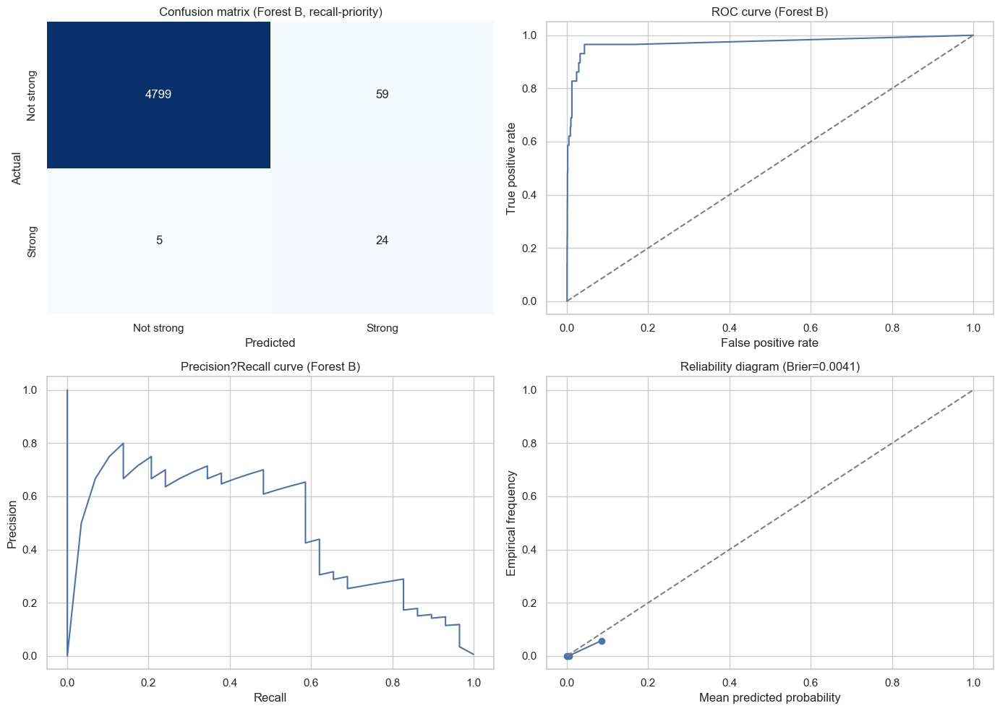

In [79]:
# Evaluation visuals for the baseline Random Forest (Model B)

from sklearn.metrics import roc_curve, precision_recall_curve

art = modelling_artifacts

y_test = art['y_test']
p_rf = art['p_rf_B']
yhat_rf = art['yhat_rf']
cal = art['calibration_curve']

cm = confusion_matrix(y_test, yhat_rf)
fpr, tpr, _ = roc_curve(y_test, p_rf)
prec, rec, _ = precision_recall_curve(y_test, p_rf)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0, 0])
axes[0, 0].set_title('Confusion matrix (Forest B, recall-priority)')
axes[0, 0].set_xlabel('Predicted')
axes[0, 0].set_ylabel('Actual')
axes[0, 0].set_xticklabels(['Not strong', 'Strong'])
axes[0, 0].set_yticklabels(['Not strong', 'Strong'])

axes[0, 1].plot(fpr, tpr)
axes[0, 1].plot([0, 1], [0, 1], linestyle='--', color='gray')
axes[0, 1].set_title('ROC curve (Forest B)')
axes[0, 1].set_xlabel('False positive rate')
axes[0, 1].set_ylabel('True positive rate')

axes[1, 0].plot(rec, prec)
axes[1, 0].set_title('Precision?Recall curve (Forest B)')
axes[1, 0].set_xlabel('Recall')
axes[1, 0].set_ylabel('Precision')

axes[1, 1].plot(cal['prob_pred'], cal['prob_true'], marker='o')
axes[1, 1].plot([0, 1], [0, 1], linestyle='--', color='gray')
axes[1, 1].set_title(f"Reliability diagram (Brier={cal['brier']:.4f})")
axes[1, 1].set_xlabel('Mean predicted probability')
axes[1, 1].set_ylabel('Empirical frequency')

plt.tight_layout()
save_matplotlib(fig, "Figure 20 random forest evaluation.png")
plt.show()


**Figure 20. Random Forest evaluation (2023 USGS, cleaned N=24,432).** Confusion, ROC, precision?recall, and reliability plots summarise rare-event performance for the baseline forest under a recall-prioritised operating point.

### 6.3 Drivers of strong-quake predictions

Feature importance is reported as *associations* in the fitted models, not causal drivers. Importance estimates can be influenced by correlated predictors and by how uncertainty fields are missing across regions.


,feature,importance_mean,importance_sd
8,gap,0.284640,0.069693
11,depthError,0.245508,0.064497
7,nst,0.231783,0.060320
12,magError,0.139506,0.117463
5,distance from equator km,0.019564,0.011392
3,abs latitude,0.008107,0.016540
1,longitude,0.006201,0.006379
20,part of day,0.005155,0.010592
13,horizontalError,0.002783,0.062932
21,season,0.000832,0.003260


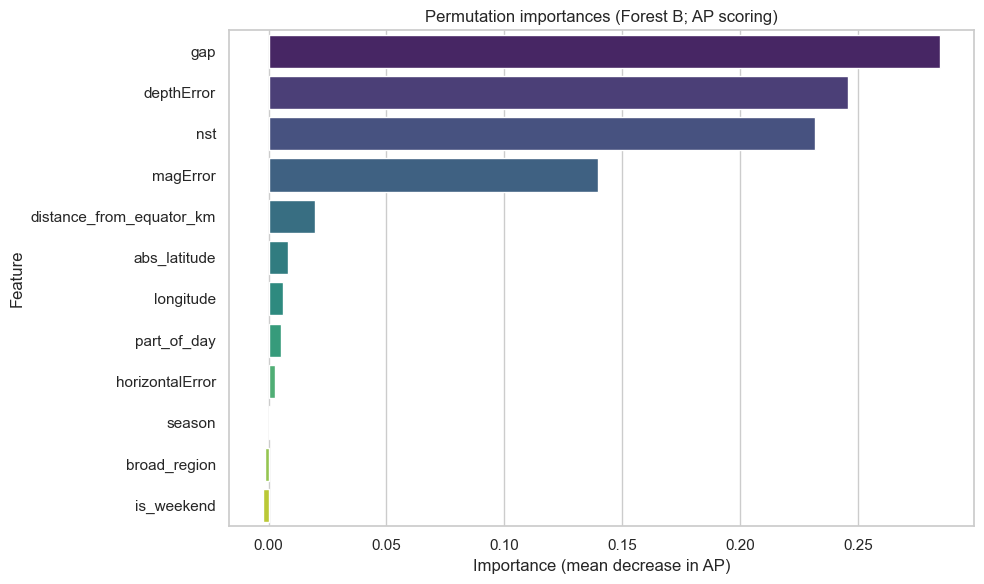

In [80]:

from sklearn.inspection import permutation_importance

art = modelling_artifacts
forest = art['forest_B']
X_test = art['X_test_B']
y_test = art['y_test']

subset_cap = 2500
X_eval = X_test.iloc[:subset_cap].copy() if len(X_test) > subset_cap else X_test

y_eval = y_test.iloc[:subset_cap].copy() if len(y_test) > subset_cap else y_test

perm = permutation_importance(
    forest,
    X_eval,
    y_eval,
    n_repeats=5,
    random_state=int(globals().get('RANDOM_SEED', 42)),
    scoring='average_precision',
    n_jobs=1,
)

feature_names = list(X_eval.columns)

importances = pd.DataFrame({
    'feature': feature_names,
    'importance_mean': perm.importances_mean,
    'importance_sd': perm.importances_std,
}).sort_values('importance_mean', ascending=False)

top_n = 12
top = importances.head(top_n).copy()

top_display = top.copy()
top_display['feature'] = top_display['feature'].astype(str).str.replace('_', ' ')

display(top_display)

plt.figure(figsize=(10, 6))
sns.barplot(data=top, x='importance_mean', y='feature', hue='feature', palette='viridis', legend=False)
plt.title('Permutation importances (Forest B; AP scoring)')
plt.xlabel('Importance (mean decrease in AP)')
plt.ylabel('Feature')
plt.tight_layout()
fig = plt.gcf()
save_matplotlib(fig, "Figure 21 permutation importances.png")
plt.show()


**Figure 21. Random forest feature importances (2023 USGS, cleaned N=24,432).**
Figure 21 shows permutation importances for the random forest under an average-precision scoring function, highlighting which predictors most affect rare-event ranking performance.

### 6.4 Interpretation

Logistic regression offers a transparent baseline and is well suited to recall-prioritised screening (at the cost of false positives). Random forests capture non-linear interactions and can raise precision, but typically require careful thresholding and calibration to avoid missed strong events.


## 7. Discussion

The discussion connects empirical patterns, data quality, and model behaviour to interpret the 2023 global catalogue.

**7. Visual synthesis for decision-making**

Across the workflow, cleaning narrows the catalogue to trustworthy events, engineered features translate that base into interpretable temporal, physical, and quality signals, and EDA demonstrates how those signals distribute across depth, region, and measurement uncertainty before they ever reach a model. The classifier choice then follows logically: a calibrated, recall-friendly baseline is appropriate because the strong-event class is rare and the depth-magnitude overlap observed in EDA makes hard rules unreliable. A key limitation is that regional proxies are coarse and observational bias varies by network density, so spatial signal is only partially captured. A concrete improvement is to add plate-boundary distance or slab-depth features and re-evaluate calibration, which would connect cleaning rules and engineered geography to more discriminative modelling. This synthesis links the empirical patterns to modelling assumptions and sets up the critical discussion below.

### 7.1 Discussion of Empirical Patterns

Regional comparisons reveal heterogeneous depth and strong-event patterns while quality varies with coverage. These patterns likely mix tectonic structure with observational bias, so the next subsection interprets model behaviour cautiously.

### 7.2 Interpretation of model behaviour

The class-weighted logistic regression provides a stable baseline and the random forest captures nonlinear interactions, but performance varies by region and depth class. This suggests contextual features help but also that coverage limits model reliability, motivating the synthesis below.

### 7.3 Synthesis: What the Analysis Tells Us

Transparent preprocessing yields robust descriptive patterns and modest predictive signal, underscoring the need for clear assumptions and rare-event metrics. The analysis favors associations over causation and points to richer tectonic context as the next improvement, leading into the conclusion.

---

## 8. Conclusion

### 8.1 Key findings and outcomes

- **Cleaned catalogue:** A reproducible pipeline reduces 26,642 raw rows to 24,432 physically plausible earthquakes, with 146 strong events (mag >= 6.0; 0.6%).
- **Feature set:** Temporal, spatial, depth-class, and measurement-quality features (including `quality_score`) support interpretable comparisons across regions and depth regimes.
- **Empirical patterns:** Epicentres align with major plate boundaries; shallow events dominate the catalogue; magnitude-depth coupling is weak at the global scale.
- **Baseline classification:** Rare-event evaluation requires precision-recall metrics and explicit threshold policies; a recall-oriented logistic regression provides a transparent screening baseline, while a random forest captures non-linear structure.

### 8.2 Strengths and limitations

- **Strengths:** Transparent preprocessing with an audit log, clear stage separation (`df_raw`/`df_clean`/`df_feat`), and deterministic evaluation with exported artefacts.
- **Limitations:** One-year scope, severe class imbalance, coarse region binning, and dependence on measurement/workflow metadata that must not be interpreted causally.

### 8.3 Reproducibility & Outputs Manifest

The notebook writes artefacts to the repository's processed-output tree. The code below prints the outputs currently present on disk after a run.


In [81]:
# Outputs manifest (relative paths)

from pathlib import Path

base = PROJECT_ROOT

roots = {
    'Data/Processed': PROCESSED_DIR,
    'Data/Processed/Figures': FIGURES_DIR,
    'Data/Processed/Maps': MAPS_DIR,
    'Data/Processed/Tables': TABLES_DIR,
}

def rel(p: Path) -> str:
    try:
        return str(p.relative_to(base))
    except Exception:
        return str(p)

print('Key outputs:')
cleaned_csv = PROCESSED_DIR / 'Earthquakes 2023 clean.csv'
print(' -', rel(cleaned_csv), '(exists)' if cleaned_csv.exists() else '(missing)')

for label, root in roots.items():
    if root.exists():
        files = sorted([p for p in root.rglob('*') if p.is_file()])
        print(f'\n{label}/ ({len(files)} files)')
        for p in files[:25]:
            print(' -', rel(p))
        if len(files) > 25:
            print(' - ...')
    else:
        print(f'\n{label}/ (missing)')


Key outputs:
 - Data\Processed\Earthquakes 2023 clean.csv (exists)

Data/Processed/ (29 files)
 - Data\Processed\Earthquakes 2023 clean.csv
 - Data\Processed\Figures\Figure 1 magnitude distribution raw.png
 - Data\Processed\Figures\Figure 10 magnitude density by depth KDE.png
 - Data\Processed\Figures\Figure 11 depth distribution sanity check.png
 - Data\Processed\Figures\Figure 12 station coverage diagnostics.png
 - Data\Processed\Figures\Figure 13 nearest station distance.png
 - Data\Processed\Figures\Figure 14 temporal reporting patterns.png
 - Data\Processed\Figures\Figure 16 magnitude vs depth.png
 - Data\Processed\Figures\Figure 18 regional seismicity comparisons.png
 - Data\Processed\Figures\Figure 19 quality score and uncertainty.png
 - Data\Processed\Figures\Figure 2 depth distribution raw.png
 - Data\Processed\Figures\Figure 2 depth distribution validity window.png
 - Data\Processed\Figures\Figure 20 random forest evaluation.png
 - Data\Processed\Figures\Figure 21 permutation

---

In [82]:
# Final QA (stages, leakage exclusion, EDA base)

required = ['df_raw', 'df_clean', 'df_feat', 'BASE_EDA_DF']
missing = [v for v in required if v not in globals()]
if missing:
    raise NameError(f"Missing required stage variables: {missing}")

BASE_EDA_DF = df_feat

print('Stage shapes:')
print(' - df_raw :', df_raw.shape)
print(' - df_clean:', df_clean.shape)
print(' - df_feat :', df_feat.shape)
print(' - BASE_EDA_DF is df_feat:', BASE_EDA_DF is df_feat)

strong_pct = float((df_clean['mag'] >= 6.0).mean() * 100)
print(f"Strong class rate (cleaned, mag>=6.0): {strong_pct:.2f}%")

leakage = {'mag', 'mag_category', 'energy_log10_J'}
for name, cols in [('MODEL_B_FEATURE_COLS', MODEL_B_FEATURE_COLS), ('MODEL_A_FEATURE_COLS', MODEL_A_FEATURE_COLS)]:
    overlap = sorted(leakage.intersection(set(cols)))
    print(f"Leakage overlap ({name}):", overlap)
    assert not overlap, f"Leakage columns present in {name}: {overlap}"

print('EDA base dataframe name for Section 5:', 'BASE_EDA_DF')


Stage shapes:
 - df_raw : (26642, 22)
 - df_clean: (24432, 22)
 - df_feat : (24432, 61)
 - BASE_EDA_DF is df_feat: True
Strong class rate (cleaned, mag>=6.0): 0.60%
Leakage overlap (MODEL_B_FEATURE_COLS): []
Leakage overlap (MODEL_A_FEATURE_COLS): []
EDA base dataframe name for Section 5: BASE_EDA_DF


## 9. References

### Data sources
- United States Geological Survey (USGS) (2023) *USGS Earthquake Catalog: global earthquake events for 2023 (CSV export)*. Available at: https://earthquake.usgs.gov/earthquakes/search/ (Accessed: 11 January 2026).
- Course project dataset (2026) *Plate boundary point cloud* (`Data/Raw/Plate Boundaries.csv`). Source attribution not provided in the distributed CSV; used as an approximate visual/proximity proxy. University of Gloucestershire (CT7201 coursework), 15 January 2026.

### Software and methods
- Breiman, L. (2001) 'Random forests', *Machine Learning*, 45(1), pp. 5-32. doi:10.1023/A:1010933404324.
- Harris, C.R. et al. (2020) 'Array programming with NumPy', *Nature*, 585, pp. 357-362. doi:10.1038/s41586-020-2649-2.
- Hunter, J.D. (2007) 'Matplotlib: A 2D graphics environment', *Computing in Science & Engineering*, 9(3), pp. 90-95. doi:10.1109/MCSE.2007.55.
- McKinney, W. (2010) 'Data structures for statistical computing in Python', in *Proceedings of the 9th Python in Science Conference (SciPy 2010)*, pp. 56-61. Available at: https://conference.scipy.org/proceedings/scipy2010/mckinney.html (Accessed: 11 January 2026).
- Pedregosa, F. et al. (2011) 'Scikit-learn: Machine learning in Python', *Journal of Machine Learning Research*, 12, pp. 2825-2830. Available at: https://jmlr.org/papers/v12/pedregosa11a.html (Accessed: 11 January 2026).
- Plotly Technologies Inc. (2015) *Plotly Python graphing library*. Available at: https://plotly.com/python/ (Accessed: 11 January 2026).
- Project Jupyter (2015) *Project Jupyter*. Available at: https://jupyter.org/ (Accessed: 11 January 2026).
- Virtanen, P. et al. (2020) 'SciPy 1.0: Fundamental algorithms for scientific computing in Python', *Nature Methods*, 17, pp. 261-272. doi:10.1038/s41592-019-0686-2.
- Waskom, M.L. (2021) 'seaborn: Statistical data visualization', *Journal of Open Source Software*, 6(60), 3021. doi:10.21105/joss.03021.

*Note:* A full environment specification (package versions) is provided by `Instructions/Requirements.txt` and the notebook's reproducibility/QA cells.
